In [243]:
import pandas as pd
import numpy as np
import re
import datetime
import seaborn as sns
import ipywidgets as widgets
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
import plotly.graph_objects as go
import folium 
from folium import plugins

from collections import OrderedDict
import plotly.express as px
import plotly 

from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.patches as mpatches
import json
from dateutil.parser import parse
%matplotlib inline

# Data Loading

In [3]:
food = pd.read_csv("data/Food_Inspections.csv")

In [4]:
# Find all columns with at least one null value
null_cols=np.sum(food.isnull() , axis=0)
null_cols[null_cols>0]

AKA Name                        2451
License #                         17
Facility Type                   4776
Risk                              72
City                             138
State                             42
Zip                               50
Inspection Type                    1
Violations                     51693
Latitude                         682
Longitude                        682
Location                         682
Historical Wards 2003-2015    194904
Zip Codes                     194904
Community Areas               194904
Census Tracts                 194904
Wards                         194904
dtype: int64

In [5]:
food.shape

(194904, 22)

Text(0.5, 0, 'Number of nans')

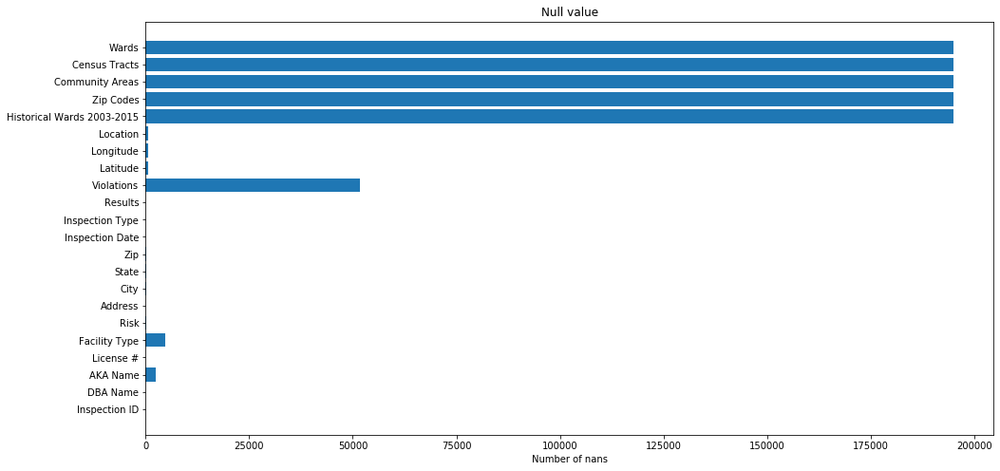

In [6]:
# Lets plot the nans
fig, ax = plt.subplots(figsize=(16,8))
ax.barh(null_cols.index, null_cols.values)
ax.set_title("Null value")
ax.set_xlabel("Number of nans")

 # Data Cleaning & Munging

The columns Historical Wards 2003-2015 , Zip Codes , Community Areas , Census Tracts and Ward are all empty. So we drop them

In [7]:
food.drop(columns=["Historical Wards 2003-2015","Zip Codes", "Community Areas", "Census Tracts", "Wards"],axis=1,inplace=True)

## Results

In [8]:
results_count = food["Results"].value_counts(sort=False)
results_count

Out of Business          16784
Pass w/ Conditions       26780
Business Not Located        67
Fail                     37698
Not Ready                 1859
No Entry                  6188
Pass                    105528
Name: Results, dtype: int64

Text(0.5, 1.0, 'Repartition of the results')

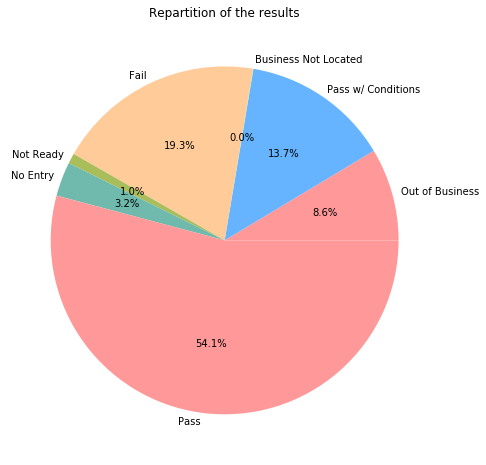

In [9]:
fig, ax = plt.subplots(figsize=(8,8))

colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#A9BD5A',"#6FBAaD"]

ax.pie(results_count.values,labeldistance=1.05,colors=colors, labels=results_count.index, autopct='%1.1f%%',
          startangle=0)

plt.title("Repartition of the results")

We are interested in business with inspections that pass or fail so we retain those

In [10]:
results=["Pass","Fail","Pass w/ Conditions"]
food=food[food["Results"].isin(results)]
food.shape

(170006, 17)

### Inspection Date

In [11]:
food["Inspection Date"].head()

0    10/25/2019
1    10/24/2019
2    10/24/2019
3    10/24/2019
4    10/24/2019
Name: Inspection Date, dtype: object

In [12]:
food["Inspection Date"] = food["Inspection Date"].apply(lambda d: parse(d))

In [13]:
food['Year'] = food["Inspection Date"].map(lambda x: x.year)
food['Month'] = food["Inspection Date"].map(lambda x: x.month)
food['Day'] = food["Inspection Date"].map(lambda x: x.day)

It makes sense to have the dataset in chronological order, so we sort it accordingly

In [14]:
food = food.sort_values(by="Inspection Date")

In [15]:
food.head()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location,Year,Month,Day
192455,67757,DUNKIN DONUTS/BASKIN-ROBBINS,DUNKIN DONUTS/BASKIN-ROBBINS,1380279.0,Restaurant,Risk 2 (Medium),100 W RANDOLPH ST,CHICAGO,IL,60601.0,2010-01-04,Tag Removal,Pass,NaN,41.884586,-87.631010,"(-87.63101044588599, 41.88458626715456)",2010,1,4
194205,67732,WOLCOTT'S,TROQUET,1992039.0,Restaurant,Risk 1 (High),1834 W MONTROSE AVE,CHICAGO,IL,60613.0,2010-01-04,License Re-Inspection,Pass,NaN,41.961606,-87.675967,"(-87.67596676683779, 41.961605669949854)",2010,1,4
193691,67733,WOLCOTT'S,TROQUET,1992040.0,Restaurant,Risk 1 (High),1834 W MONTROSE AVE,CHICAGO,IL,60613.0,2010-01-04,License Re-Inspection,Pass,NaN,41.961606,-87.675967,"(-87.67596676683779, 41.961605669949854)",2010,1,4
194066,67738,MICHAEL'S ON MAIN CAFE,MICHAEL'S ON MAIN CAFE,2008948.0,Restaurant,Risk 1 (High),8750 W BRYN WAWR AVE,CHICAGO,IL,60631.0,2010-01-04,License,Fail,18. NO EVIDENCE OF RODENT OR INSECT OUTER OPEN...,NaN,NaN,NaN,2010,1,4
193882,70269,mr.daniel's,mr.daniel's,1899292.0,Restaurant,Risk 1 (High),5645 W BELMONT AVE,CHICAGO,IL,60634.0,2010-01-04,License Re-Inspection,Pass,NaN,41.938443,-87.768318,"(-87.76831838068422, 41.93844282365204)",2010,1,4


### Zip

Since there are only 31 cases with nan zip, we simply drop them

In [16]:
food=food[food["Zip"].notnull()]

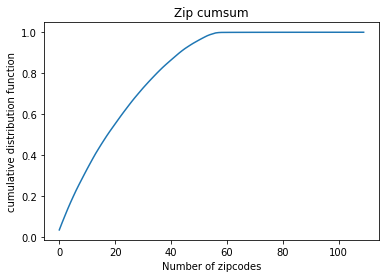

In [17]:
zip_=food["Zip"].value_counts().cumsum()/food.shape[0]
zip_=zip_.reset_index()
plt.plot(zip_["Zip"])
plt.title("Zip cumsum")
plt.xlabel("Number of zipcodes")
plt.ylabel("cumulative distribution function")
plt.show()

20 Zipcodes out of 110 are where more than half of inspections take place, it's interesting to check in our further analysis whether these places are just highly dense or are they actually more prone to food inspections

### City and State

In [18]:
food[food.State.isnull() & food.City.isnull()]["Address"].unique()

array(['636 N RACINE AVE ', '500 N MILWAUKEE AVE ',
       '506 N Milwaukee AVE ', '1438 W CORTLAND ST '], dtype=object)

All Null values in State and City are in Chicago ( checked with the respective adresses)

In [19]:
food[food.State.isnull() & food.City.notnull()]["City"].unique()

array(['CHICAGO'], dtype=object)

Null values in State with a known city are all in Chicago

In [20]:
food[(food.City.isnull()) & (food["State"]!="IL")]["Address"].unique()

array(['636 N RACINE AVE ', '500 N MILWAUKEE AVE ',
       '506 N Milwaukee AVE ', '1438 W CORTLAND ST '], dtype=object)

All Null values in City are in Chicago ( checked with the respective adresses)

In [21]:
food["State"].fillna("IL", inplace=True)
food=food[food["State"]=="IL"]
food["City"].fillna("Chicago", inplace=True)

In [22]:
food[food["City"]!="CHICAGO"]["City"].unique()

array(['chicago', 'Chicago', 'CCHICAGO', 'CHESTNUT STREET',
       'CHICAGOCHICAGO', 'CHCICAGO', 'CHCHICAGO', 'OAK PARK', 'ALSIP',
       'EVERGREEN PARK', 'CHARLES A HAYES', 'EAST HAZEL CREST', 'MAYWOOD',
       'Maywood', 'WORTH', 'CHicago', 'BROADVIEW', 'BLUE ISLAND',
       'NAPERVILLE', 'FRANKFORT', 'GLENCOE', 'CHICAGOI', 'OAK LAWN',
       'CICERO', 'STREAMWOOD', 'OLYMPIA FIELDS', 'BERWYN', 'LAKE ZURICH',
       'DES PLAINES', 'BURNHAM', 'SUMMIT', 'BOLINGBROOK',
       'COUNTRY CLUB HILLS', 'LOMBARD', 'CHICAGO HEIGHTS', 'TINLEY PARK',
       'JUSTICE', 'OOLYMPIA FIELDS', 'ELK GROVE VILLAGE', 'EVANSTON',
       'CALUMET CITY', 'SKOKIE', 'Norridge', 'ELMHURST', 'BLOOMINGDALE',
       'SCHAUMBURG', 'BANNOCKBURNDEERFIELD', 'BEDFORD PARK', 'BRIDGEVIEW',
       'SCHILLER PARK', 'NILES NILES', '312CHICAGO', 'LAKE BLUFF',
       'CHICAGOHICAGO', 'PALOS PARK', 'PLAINFIELD', 'HIGHLAND PARK',
       'CHICAGO.', 'ROSEMONT', 'WHEATON', 'WADSWORTH', 'LANSING',
       'ALGONQUIN'], dtype=object

In [23]:
Illinois_zipcode=(60001,62999)
suburbs_zipcode=food[food["City"]!="CHICAGO"]["Zip"].unique()
# All the suburbs are within the Illinois zipcode range
all(Illinois_zipcode[0]<=city_zipcode<=Illinois_zipcode[1] for city_zipcode in suburbs_zipcode)

True

All these values are either typos for Chicago or Chicago suburbs (checked by zip code), so we keep them.

Since the columns City and State don't give us relevant information, we drop them

In [24]:
food=food.drop(columns=["City","State"])

### Location

In [25]:
# Fill the null location values with default Chicago location
default_lat=41.85003
default_long=-87.65005
default_location='(-87.65005,41.85003)'
food[food["Location"]==default_location]

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location,Year,Month,Day


No other business has this location, so we can drop it when we need to plot

In [26]:
food["Latitude"].fillna(default_lat,inplace=True)
food["Longitude"].fillna(default_long,inplace=True)
food["Location"].fillna(default_location,inplace=True)

In [27]:
food_plot = food[food["Location"] != default_location]

In [28]:
m = folium.Map([41.85003, -87.65005], zoom_start=10)

sample_locaions = food_plot.sample(30000)[["Latitude", "Longitude"]].values

m.add_child(plugins.HeatMap(sample_locaions.tolist(), radius=10))
m


### License number

In [29]:
food[food["License #"].isnull()].shape

(16, 18)

In [30]:
food.groupby("License #").Location.nunique().sort_values(ascending=False).head()

License #
0.0          192
2458393.0      3
2225602.0      2
46041.0        2
2511398.0      2
Name: Location, dtype: int64

Since there are 16 nans, and we see that a lot of unidentified license are set to 0, we set them also to 0

In [31]:
food["License #"].fillna(0,inplace=True)

### Violations

As seen in the dataset description:

An establishment can receive one or more of 45 distinct violations (violation
numbers 1-44 and 70). For each violation number listed for a given establishment, the
requirement the establishment must meet in order for it to NOT receive a violation is
noted, followed by a specific description of the findings that caused the violation to be
issued.

For the null values in Violations, we will just replace them with "0. None reported" since the violations are numbered

In [32]:
food["Violations"].fillna("0. None Reported", inplace=True)

It's specified in the Food Inspection Reporting System (https://webapps1.chicago.gov/healthinspection/Code_Violations.jsp#1crit) 
that we can have 3 types of violation :

    -For violation number 1-14 it refers to critical violations.
    -For violation number 15-29 it refers to serious violations.
    -For the rest it refers to no critical violations,minor (30-44,70). 

For each inspection we have a list of a description of each violation discovered, the description is composed of 3 elements:
   
    -The violation number
    -The violation title
    -Comments

Therefore we parse the descriptions to separate the 3 entities.

In [33]:
# Initiating the 3 columns
violation_number = []
violation_title = []
violation_comment = []
# Initiating the exploded dataframe with 4 columns : ids, number , title and comments
number_exploded = []
ids_exploded = []
title_exploded = []
comment_exploded = []
    
def violation_parsing(row):
    """
    This function iterates over the Violations columns in the original dataset and returns three seperate columns:
    Violation number, title and comments
    Also, it returns a new dataframe where all seperate violations tuples have unique rows
    """
    
    
    

    # spliting seperate violations
    list_violation= row['Violations'].split(' | ')
    numbers = []
    titles = []
    comments = []
    for vl in list_violation:

        ids_exploded.append(row['Inspection ID'])

        # splitting the title from the comments
        comment_splited = vl.split('- Comments:')

        # splitting the number from the title
        split_point = comment_splited[0].split('.')

        # appending the number
        numbers.append(split_point[0])
        number_exploded.append(split_point[0])

        #appending the title
        titles.append(split_point[1].strip())
        title_exploded.append(split_point[1].strip())

        # checking whether a comment exists and then appending it, otherwise we append an empty comment
        if(len(comment_splited) <= 1):
            comments.append("")
            comment_exploded.append("")
        else:
            comments.append(comment_splited[1].strip())
            comment_exploded.append(comment_splited[1].strip())

    violation_number.append(numbers)
    violation_title.append(titles)
    violation_comment.append(comments)



In [34]:

food.apply(violation_parsing,axis=1)
violation_exploded = pd.DataFrame({"ids": ids_exploded ,"numbers" : number_exploded , "titles" : title_exploded, "comments" : comment_exploded})
food ['Violation numbers'] =violation_number
food ['Violation title']=violation_title
food ['Violation comments']=violation_comment 

In [35]:
# showing all different violation codes
count_violation = violation_exploded.groupby(['numbers']).comments.count()
count_violation.index = count_violation.index.map(lambda x: int(x))
count_violation = count_violation.sort_index()
count_violation.index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
            34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
            51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 70],
           dtype='int64', name='numbers')

We are surprised to find violation numbers that are above 44 ! This is really weird as it was not specified in the Food Inspection Reporting System.

In [36]:
# showing their respective titles
weird_cases = violation_exploded[(violation_exploded['numbers'].astype(int) > 44) & (violation_exploded['numbers'] != "70") ]

weird_cases.groupby(['numbers']).titles.value_counts()

numbers  titles                                                                           
45       FOOD HANDLER REQUIREMENTS MET                                                         7475
         SINGLE-USE/SINGLE-SERVICE ARTICLES: PROPERLY STORED & USED                             415
46       GLOVES USED PROPERLY                                                                    76
47       FOOD & NON-FOOD CONTACT SURFACES CLEANABLE, PROPERLY DESIGNED, CONSTRUCTED & USED     6514
48       WAREWASHING FACILITIES: INSTALLED, MAINTAINED & USED; TEST STRIPS                     1669
49       NON-FOOD/FOOD CONTACT SURFACES CLEAN                                                  4649
50       HOT & COLD WATER AVAILABLE; ADEQUATE PRESSURE                                          281
51       PLUMBING INSTALLED; PROPER BACKFLOW DEVICES                                           5526
52       SEWAGE & WASTE WATER PROPERLY DISPOSED                                                 374
53       

In [37]:
colors = ["Purple"] + ["red"] * 14 + ["orange"] * 15 + ["yellow"] *15 + ["green"] *19 + ["yellow"]
df_count = pd.DataFrame({'number' : count_violation.index, 'count' :  count_violation.values, 'color' : colors} )

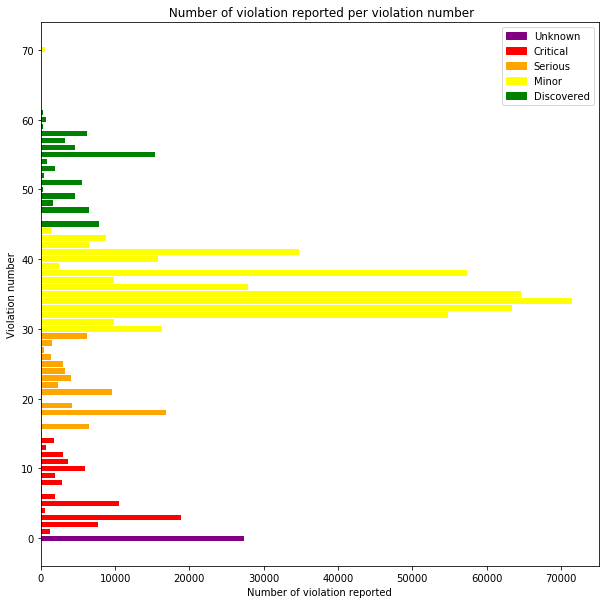

In [38]:
# plotting violations frequencies
fig, ax = plt.subplots(figsize=(10,10))
ax.barh(df_count['number'] ,df_count['count'], color = df_count['color'])

UK = mpatches.Patch(color='purple', label='Unknown')
CR = mpatches.Patch(color='red', label='Critical')
SR = mpatches.Patch(color='orange', label='Serious')
MI = mpatches.Patch(color='yellow', label='Minor')
DS = mpatches.Patch(color='green', label='Discovered')
plt.legend(handles=[UK,CR,SR,MI,DS], loc=1)
plt.xlabel("Number of violation reported")
plt.ylabel("Violation number")
plt.title(" Number of violation reported per violation number")
plt.show()

For each inspection we consider a score that counts the number of violations per type of violation (minor,serious,critical). 

The new violation numbers (44-63) are grouped with the minor violations.

In [39]:
def score(numbers):
    """ This function creates a score for the violation according to its category (minor,serious,critical)
    and returns the score as a tuple
    """
    minor = 0
    serious = 0
    critical = 0
    for number in numbers:
        number = int(number)
        if( (number >=1) & (number <=14) ):
            critical+=1
        elif ((number >=15) and (number <=29) ) :
            serious+=1
        elif (number >29) :  
            minor+=1
    return minor,serious,critical

food['Violation score minor']    = food ['Violation numbers'].map(lambda x : score(x)[0])
food['Violation score serious']  = food ['Violation numbers'].map(lambda x : score(x)[1])
food['Violation score critical'] = food ['Violation numbers'].map(lambda x : score(x)[2])

Depending on that score we want to know how the results evolve. 

In [40]:
#group by score and count the the number of inspection 
violation_score = food.groupby(['Violation score minor','Violation score serious','Violation score critical']).Results.value_counts().unstack().reset_index()
violation_score.fillna(0, inplace=True)

#transforming the count to an empirical probability
sums = violation_score.loc[:, ['Fail','Pass','Pass w/ Conditions']].sum(axis=1).values.reshape((-1,1))
violation_score.loc[:,['Fail','Pass','Pass w/ Conditions']]= violation_score.loc[:,['Fail','Pass','Pass w/ Conditions']] /sums

violation_score.head()

Results,Violation score minor,Violation score serious,Violation score critical,Fail,Pass,Pass w/ Conditions
0,0,0,0,0.113151,0.870763,0.016086
1,0,0,1,0.361307,0.042403,0.596290
2,0,0,2,0.114050,0.019835,0.866116
3,0,0,3,0.205479,0.000000,0.794521
4,0,0,4,0.300000,0.000000,0.700000


<IPython.core.display.Javascript object>


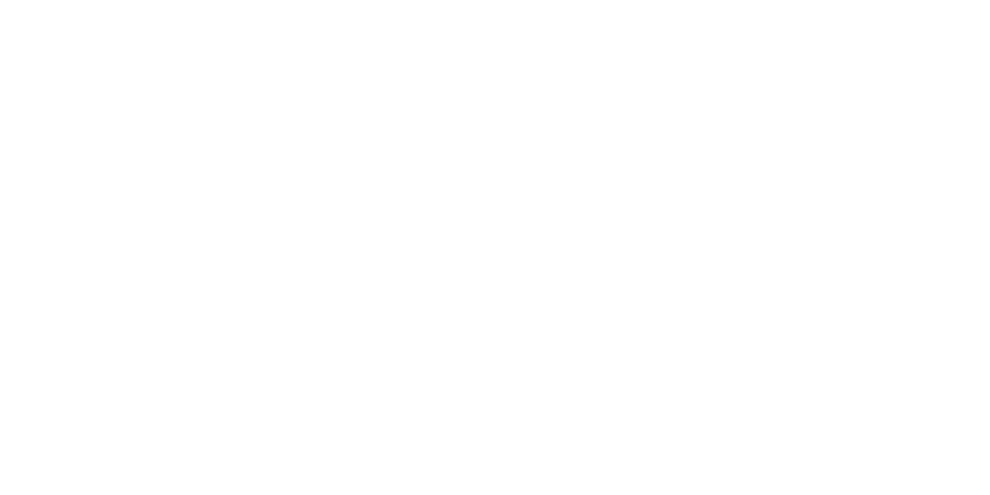

<IPython.core.display.Javascript object>


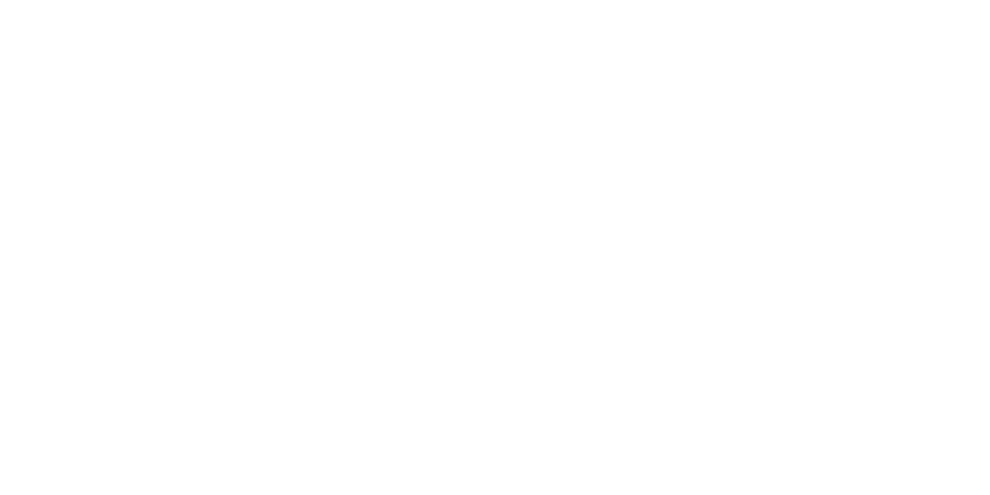

In [41]:
#We create a 3D space representing the score space and we plot  the probability to fail in that space
%matplotlib notebook
fig = plt.figure(figsize=(10,5))
ax = Axes3D(fig)

p=ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Fail'], cmap='YlOrRd',s=30)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to fail with the number of failed violations")

fig.colorbar(p,label="Probability to fail")

plt.show()


We can observe in this 3D plot the probability to fail depending on the number of violations per category.
Depending on the axis we can observe that the increase of the violations has a different impact on the probability to fail.
The violation score minor doesn't affect the probability to fail where as when we start to increase just a little bit the serious or critical score the probability to fail becomes very close to 1. 

<IPython.core.display.Javascript object>


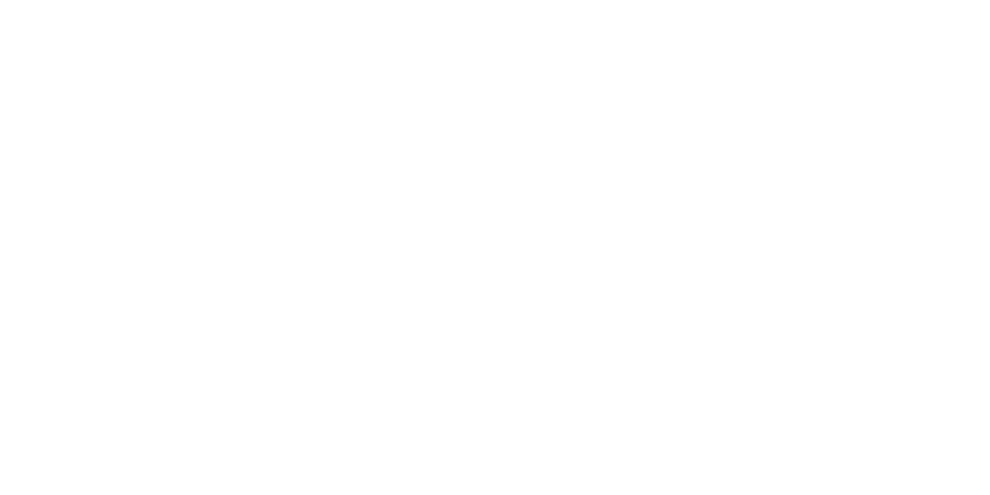

<IPython.core.display.Javascript object>


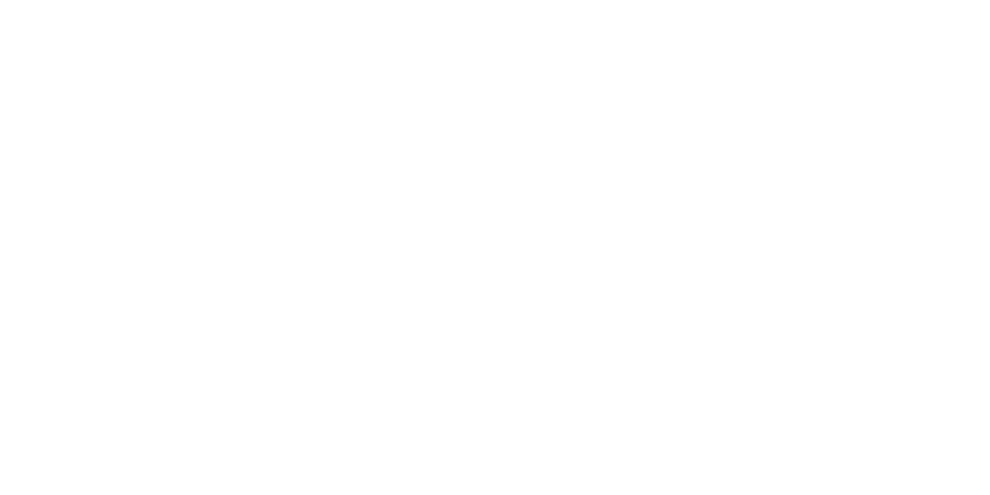

In [42]:
#plotting the probability to pass in the space of the score 

fig = plt.figure(figsize=(10,5))

ax = Axes3D(fig)

p = ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Pass'], cmap='YlOrRd',s=40)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to pass with the number of failed violations")

fig.colorbar(p,label="Probability to pass")

plt.show()

We observe that the violation score minor doesn't affect the probability to pass. We also see that there is a high probability to pass if there are very few serious and critical violation scores

<IPython.core.display.Javascript object>


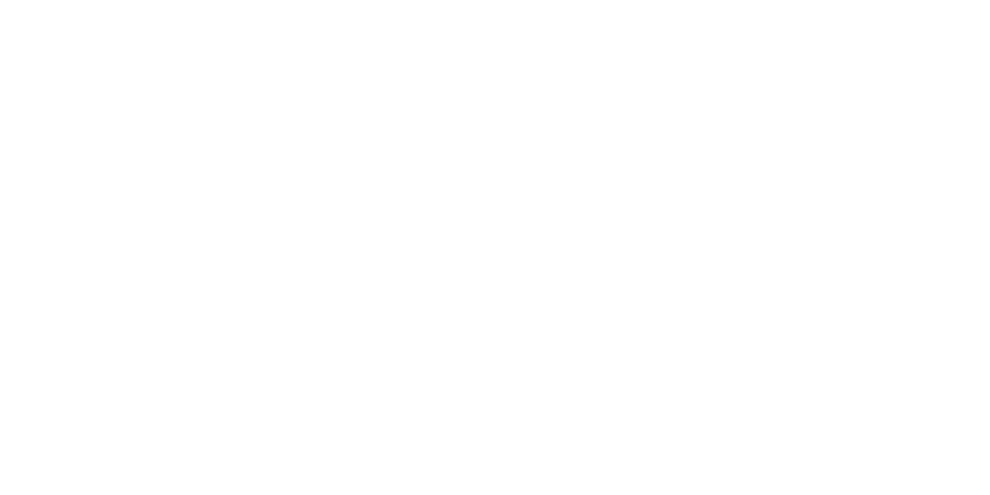

<IPython.core.display.Javascript object>


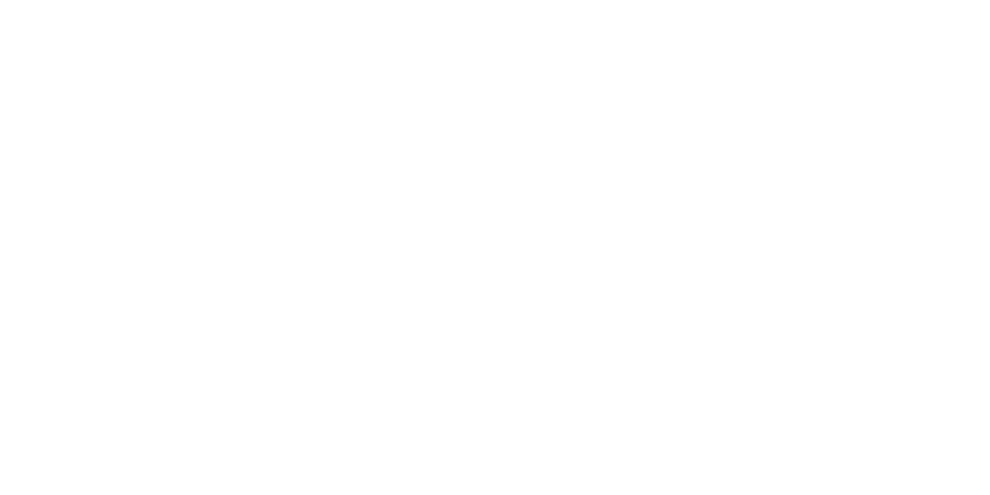

In [43]:
#plotting the probability to pass with condition in the space of the score 

fig = plt.figure(figsize=(10,5))

ax = Axes3D(fig)

p = ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Pass w/ Conditions'], cmap='YlOrRd',s=40)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to Pass w/ Conditions with the number of failed violations")

fig.colorbar(p,label="Probability to pass with condition")
plt.show()

In this plot we can see that if you have low scores you will not pass with condition because you will just pass and if you have high scores you will fail. We can observe that if you have a lot of minor violations you have a high probability to pass with conditions .

In [44]:
food.groupby('Results')['Violation score minor'].mean()

Results
Fail                  3.941411
Pass                  2.492176
Pass w/ Conditions    3.540392
Name: Violation score minor, dtype: float64

In [45]:
food.groupby('Results')['Violation score serious'].mean()

Results
Fail                  1.156398
Pass                  0.003592
Pass w/ Conditions    0.590140
Name: Violation score serious, dtype: float64

In [46]:
food.groupby('Results')['Violation score critical'].mean()

Results
Fail                  0.719312
Pass                  0.004350
Pass w/ Conditions    1.231335
Name: Violation score critical, dtype: float64

### Facility Type

In [47]:
food["Facility Type"]=food["Facility Type"].str.casefold()

In [48]:
# We can check different grocery store types and set them all to "grocery store"
groceries=food[["grocer" in  str(facility) for facility in food["Facility Type"]]]["Facility Type"]
groceries.unique()

array(['grocery store', 'grocery& restaurant', 'slaughter house/ grocery',
       'grocery/cafe', 'gas station/ grocery store',
       'grocery(sushi prep)', 'pharmacy/grocery', 'grocery and butcher',
       'grocery/butcher', 'grocery/restaurant', 'grocery store/bakery',
       'drug/grocery store', 'grocery store/taqueria', 'grocery/liquor',
       'grocery/taqueria', 'gas station /grocery', 'restaurant/grocery',
       'grocery & restaurant', 'restaurant/grocery store',
       'grocery store/cooking school', 'grocery/ restaurant',
       'rest/grocery', 'grocery store/ restaurant',
       'grocery store/gas station', 'drug store/grocery', 'grocery',
       'grocery/dollar store', 'grocery/service gas station',
       'gas station/store grocery', 'grocery/bakery',
       'dollar store selling grocery', 'grocery store/deli',
       'grocery store / gas station', 'bakery/grocery',
       'grocery/gas station', 'grocery/tavern', 'grocery/liquor store',
       'grocery/drug store', 'doll

In [49]:
food.loc[["grocer" in  str(facility) for facility in food["Facility Type"]],"Facility Type"]="grocery store"

In [50]:
fvc=food["Facility Type"].value_counts()
fvc[fvc>20].head(10)

restaurant                         114651
grocery store                       22308
school                              11720
children's services facility         2864
bakery                               2508
daycare (2 - 6 years)                2373
daycare above and under 2 years      2193
long term care                       1277
catering                              988
mobile food dispenser                 795
Name: Facility Type, dtype: int64

In [51]:
print("We have {0} other categories for a total number of {1} businesses".format(fvc[fvc<20].shape[0], fvc[fvc<20].sum()))

We have 330 other categories for a total number of 1481 businesses


In [52]:
fvc[fvc<20].head(20)

roof top                             19
after school program                 19
hotel                                18
nursing home                         18
mobile desserts vendor               18
paleteria                            18
wrigley roof top                     17
gas station/mini mart                17
brewery                              16
supportive living                    16
rooftops                             16
pop-up establishment host-tier ii    15
theatre                              15
long term care facility              15
fitness center                       15
university cafeteria                 15
mobile food truck                    14
health/ juice bar                    14
wrigley rooftop                      14
airport lounge                       14
Name: Facility Type, dtype: int64

We don't see a proper way to aggregate these outliers, so it might be interesting to set them to other

In [53]:
lower_than_20 = fvc[fvc<20].index

food.loc[food["Facility Type"].isin(lower_than_20),"Facility Type"] ="other" 

For the null values in Facility Type, we will just replace them with "Unspecified"

In [54]:
food["Facility Type"].fillna("Unspecified", inplace=True)

Now we can see a proper distribution for the top 10 facilities

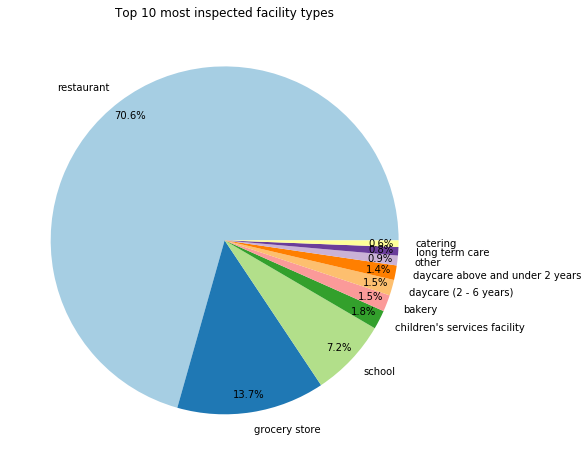

In [55]:
%matplotlib inline
top10_facilities=food["Facility Type"].value_counts().head(10)
fig1, ax1 = plt.subplots(figsize=(8,8))
theme = plt.get_cmap('Paired')
ax1.set_prop_cycle("color", [theme(1. * i / 10)
                             for i in range(10)])
ax1.set_title("Top 10 most inspected facility types")
ax1.pie(top10_facilities.values,labeldistance=1.1, labels=top10_facilities.index, autopct='%1.1f%%',
          pctdistance=0.9, startangle=0)

plt.show()

### Risk

In [56]:
food["Risk"].value_counts()

Risk 1 (High)      125149
Risk 2 (Medium)     32808
Risk 3 (Low)        11976
All                     5
Name: Risk, dtype: int64

5 entries are marked as Risk : ALL . As we don't know the meaning of it and that those entries contain many null values,
We choose to drop these entries

In [57]:
food=food[food["Risk"]!="All"].copy()

In [58]:
food[food["Risk"].isnull()]["Inspection ID"].count()

34

34 entries in Risk are null, since there is no appropiate way to impute them, we choose to drop them

In [59]:
food=food[food["Risk"].notnull()]

Let's try to understand how risk is distributed

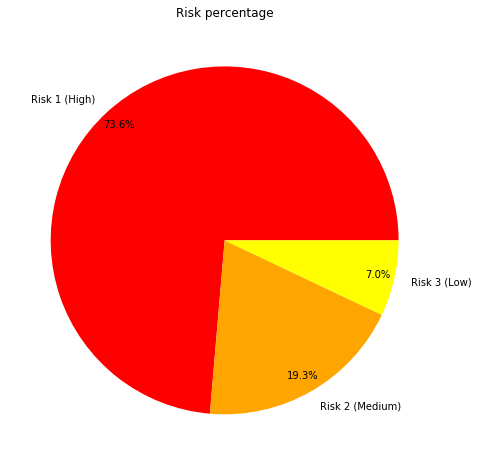

In [60]:
risk_count=food["Risk"].value_counts()
fig, ax = plt.subplots(figsize=(8,8))
ax.set_title("Risk percentage")

ax.pie(risk_count.values,labeldistance=1.1,colors=["red","orange","yellow"], labels=risk_count.index, autopct='%1.1f%%',
          pctdistance=0.9, startangle=0)

plt.show()

Let's see their correlation with the results of inspections

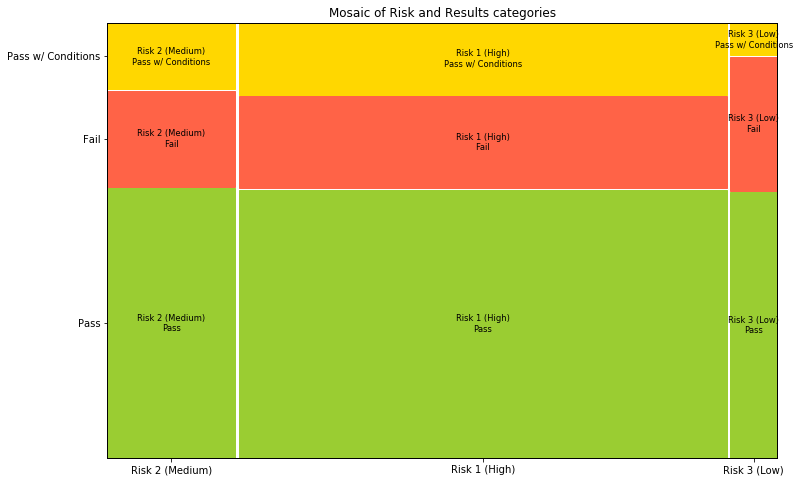

In [61]:
fig, ax = plt.subplots(figsize=(12,8))

props = lambda key: {'color': "yellowgreen" if "Pass" in key else "tomato" if "Fail" in key else "gold"}
mosaic(food,["Risk","Results"], ax=ax ,properties=props)
plt.title("Mosaic of Risk and Results categories")
plt.show()

We see that the pass percentage doesn't really depend on the risk type, although facilities with low risk have slightly more chance to fail

Let's observe the evolution of the risk thought time.

In [62]:
year_inspection_risk = pd.DataFrame(food.groupby(['Year','Risk'])['Inspection ID'].count()).reset_index()

year_inspection_risk = year_inspection_risk.pivot(index='Year', values='Inspection ID', columns='Risk')

year_inspection_risk.fillna(0, inplace=True)

year_inspection_risk

Risk,Risk 1 (High),Risk 2 (Medium),Risk 3 (Low)
Year,,,
2010,11662,3773,1922
2011,11715,4018,1834
2012,11162,3272,1576
2013,12160,3622,1280
2014,13848,3603,1163
2015,13429,3451,1009
2016,15193,3835,831
2017,14420,3200,875
2018,11814,2264,770


Text(0, 0.5, 'Number')

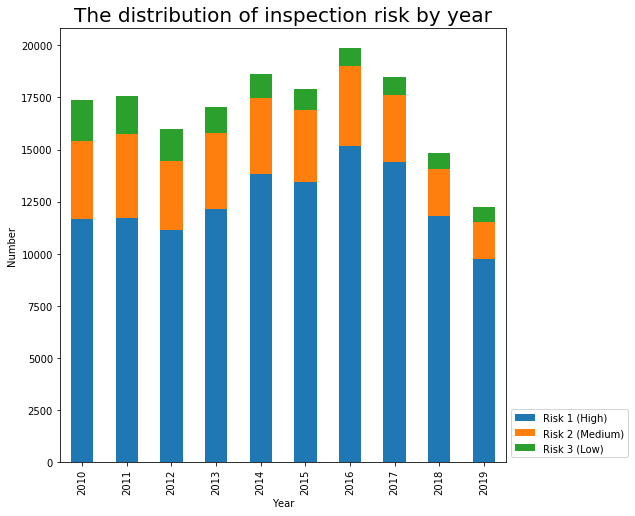

In [63]:
fig, ax = plt.subplots(figsize=(10,10))

year_inspection_risk.plot(kind='bar',stacked=True,figsize=(8,8),ax=ax )

plt.legend(loc="lower left", bbox_to_anchor=(1,0))
ax.set_title("The distribution of inspection risk by year",size=20)
ax.set_xlabel('Year')
ax.set_ylabel('Number')

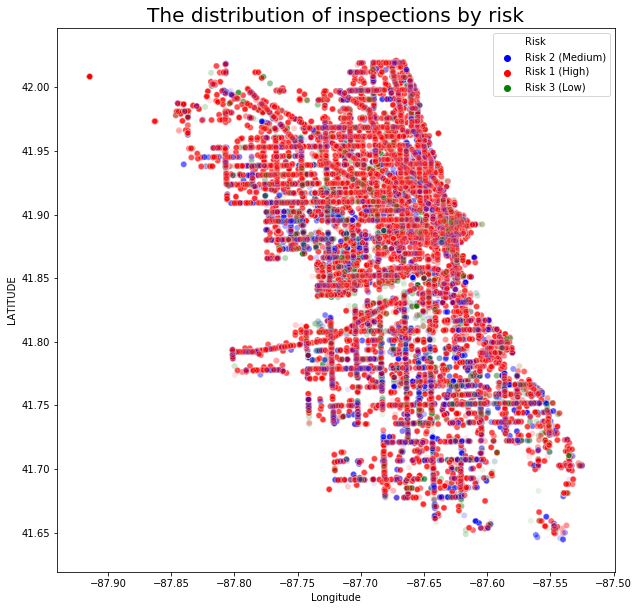

In [369]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(x='Longitude', y='Latitude', hue='Risk' , data=food, ax=ax,alpha=0.1, palette = ["blue","red","green"])
ax.set_title("The distribution of inspections by risk",size=20)
ax.set_xlabel('Longitude')
ax.set_ylabel('LATITUDE')
plt.show()

We can't really see a general pattern let's compute the mean risk per zipcode.

We would like to check if the theoretical average number of inspections per year for each risk category is respected.

In the article the following accusations are done: 

The report says that the Chicago Department of Public Health inspected only 3,566, or 43.9 percent, of high-risk establishments at least twice in 2015; only 2,478, or 80.1 percent, of medium-risk establishments at least once in 2015; and only 1,078, or 24.8 percent, of low-risk establishments at least once in 2014 or 2015*.

Let's first check for 2015 :

In [182]:
df_nbre_visit_2015 = food[(food['Year']== 2015)].groupby(['AKA Name','Address','Risk'])[['Year']].count()
df_nbre_visit_2015.head()

Year
AKA Name            Address               Risk               
1 Chop Suey         1907 W 87TH ST        Risk 1 (High)     1
                    2550 W ADDISON ST     Risk 1 (High)     2
                    4307 W IRVING PARK RD Risk 1 (High)     4
1 St Chop Suey      5845 S ARCHER AVE     Risk 1 (High)     1
1 St Fresh Catering 205 W Randolph ST     Risk 1 (High)     2

In [183]:
df_nbre_visit_2015.groupby('Risk').mean()

,Year
Risk,
Risk 1 (High),1.610578
Risk 2 (Medium),1.453665
Risk 3 (Low),1.449713


We can see that the risk 1 category average is below the average whereas the category 2 and 3 are superior to 1.

Let's see the evolution of these numbers from 2010 to 2015. 

In [185]:
df_nbre_visit = food.groupby(['AKA Name','Address','Risk','Year'])[['Inspection ID']].count().rename(columns={"Inspection ID": "# visits"})
df_nbre_visit.head()

# visits
AKA Name            Address              Risk          Year          
1 China Express Ltd 4248 S WENTWORTH AVE Risk 1 (High) 2010         1
1 Chop Suey         1907 W 87TH ST       Risk 1 (High) 2010         3
                                                       2011         1
                                                       2013         2
                                                       2014         2

In [186]:
df_risk_yer = df_nbre_visit.groupby(['Risk','Year']).mean().rename(columns={"# visits": "Visits yearly average"})
df_risk_yer.head()

Visits yearly average
Risk          Year                       
Risk 1 (High) 2010               1.688921
              2011               1.748247
              2012               1.612307
              2013               1.550229
              2014               1.783157

In [189]:
fig = px.line(df_risk_yer.reset_index(), x="Year", y="Visits yearly average", color='Risk')
fig.update_layout(
    title={
        'text': "Evolution of the number of visits per risk from 2010 to 2019",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}
    ,yaxis={'range': [1,2]})
fig.show()

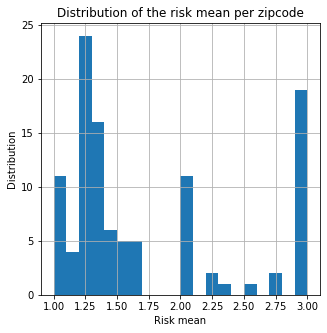

In [65]:
food['Risk number'] = food['Risk'].map(lambda x : int(str(x).split(' ')[1]))
mean_risk_zip = food.groupby('Zip').mean()['Risk number']

fig, ax = plt.subplots(figsize=(5,5))
mean_risk_zip.hist(bins=20)
ax.set_title("Distribution of the risk mean per zipcode")
ax.set_xlabel("Risk mean")
ax.set_ylabel("Distribution")
plt.show()

df_risk_zip = pd.DataFrame({'Zip': mean_risk_zip.index.astype(int).astype(str), 'Risk mean' :mean_risk_zip.values} )


We draw the results on the map using GeoJson zipcode file.

In [66]:
with open("data/Boundaries-ZIP-Codes.geojson") as json_file:
    zipcodes = json.load(json_file)
    
m = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.GeoJson(zipcodes).add_to(m)
m.save("initial_zip.html")
m

This is the map of chicago divided by zipcode

In [67]:
m1 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=df_risk_zip,
    columns=['Zip', 'Risk mean'],
    key_on='feature.properties.zip',
    fill_color='RdYlBu',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Risk Mean",
    show=False,
).add_to(m1)

m1.save("zip_risk_mean.html")
m1

We now look at the proportion of fail, pass and pass wtih condition per zip code. 

In [68]:
food.Results.value_counts()

Pass                  105499
Fail                   37659
Pass w/ Conditions     26775
Name: Results, dtype: int64

In [69]:
food.groupby('Zip').Results.count().sort_values(ascending = False)

Zip
60614.0    6167
60647.0    5922
60657.0    5713
60611.0    5623
60622.0    5327
           ... 
60189.0       1
60477.0       1
60464.0       1
60202.0       1
60453.0       1
Name: Results, Length: 107, dtype: int64

In [70]:
# we group by zip and count the number of fail/pass that we normalize after
dist_zip = food.groupby('Zip').Results.value_counts().unstack().reset_index().fillna(0)

# We sum up the groups

sums = dist_zip.loc[:, ['Fail','Pass','Pass w/ Conditions']].sum(axis=1).values.reshape((-1,1))
# We normalize them

dist_zip.loc[:,['Fail','Pass','Pass w/ Conditions']]= dist_zip.loc[:,['Fail','Pass','Pass w/ Conditions']] /sums

# We count the number of samples to have an idea about the significance of our statistics
dist_zip['# of samples'] = food.groupby('Zip').Results.count().values
dist_zip.Zip = dist_zip.Zip.map(lambda x : str(int(x)) ) 
dist_zip.sort_values(ascending = False , by= "# of samples")

Results,Zip,Fail,Pass,Pass w/ Conditions,# of samples
55,60614,0.226042,0.568672,0.205286,6167
87,60647,0.241810,0.600304,0.157886,5922
95,60657,0.222825,0.593559,0.183616,5713
52,60611,0.165926,0.649475,0.184599,5623
63,60622,0.237094,0.615919,0.146987,5327
...,...,...,...,...,...
14,60148,0.000000,1.000000,0.000000,1
29,60438,0.000000,1.000000,0.000000,1
16,60155,0.000000,1.000000,0.000000,1
27,60423,0.000000,1.000000,0.000000,1


In [71]:
dist_zip["Fail"].sort_values()

33    0.000000
21    0.000000
22    0.000000
24    0.000000
26    0.000000
        ...   
7     0.500000
2     0.500000
41    0.666667
39    0.750000
38    0.800000
Name: Fail, Length: 107, dtype: float64

In [72]:
m2 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Fail'],
    key_on='feature.properties.zip',
    fill_color='Reds',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Fail probability",
    show=True,
).add_to(m2)

m2.save("zip_fail.html")
m2

In [73]:
m3 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Pass'],
    key_on='feature.properties.zip',
    fill_color='RdYlGn',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Pass probability",
    show=False,
).add_to(m3)

m3.save("zip_pass.html")
m3

In [74]:
m4 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Pass w/ Conditions'],
    key_on='feature.properties.zip',
    fill_color='Blues',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Pass with conditions probability",
    show=False,
).add_to(m4)

m4.save("zip_pass_conditions.html")
m4

### Inspection type

There only is one nul value for Inspection type, we drop it

In [75]:
food = food[food["Inspection Type"].notnull()]

An inspection can be one of the following types: 
    
    -canvass, the mostcommon type of inspection performed at a frequency relative to the risk of the establishment;
    
    -consultation, when the inspection is done at the request of the owner prior to the opening of the establishment; 
    
    -complaint, when the inspection is done in response to a complaint against the establishment;
    
    -license, when the inspection is done as a requirement for the establishment to receive its license to operate;
    
    -suspect food poisoning, when the inspection is done in response to one or more persons claiming to have gotten ill as a result of eating at the establishment (a specific type of complaint-based inspection);

    -task-force inspection, when an inspection of a bar or tavern is done.

Re-inspections can occur for most types of these inspections and are indicated as such. 


In [76]:
food["Inspection Type"].nunique()

102

We observe that we have several inspection's types representing the same thing and thus we can regroup them.

In [77]:
food["Inspection Type exact"] = food["Inspection Type"].copy()

In [78]:
# Hardocde grouping of inspection types
def inspection_cleaning(x):
    
    x=str(x).lower()
    x=re.sub("re-","re",x)
    if ('reinspection' in x ):
        return 'reinspection'
    elif ('sfp' in x or 'fbi' in x or 'sick' in x or 'poisoning' in x ):
        x= 'food poisoning' 
    elif ('canvas' in x ):
        x= 'canvass' 
    elif ('complaint' in x ):
        x="complaint"
    elif ('license' in x ):
        x="license"
    elif ('task' in x ) :
        x='task force'
    
    return x
food["Inspection Type"] = food["Inspection Type"].apply(inspection_cleaning)

In [79]:
food["Inspection Type"][0]

'reinspection'

Staphylococcal food poisoning (SFP) is one of the most common food-borne diseases worldwide.

The FBI or Fungus, Bacteria, and Invertebrates are decomposers.

In [80]:
food["Inspection Type"].nunique()

36

In [81]:
kept = ["canvass", "reinspection", "license", "complaint", "suspected food poisoning", "consultation", "tag removal", "recent inspection", "out of business", "task force", "food poisoning"] 

food["Inspection Type"] = food["Inspection Type"].map(lambda x: x if (x in kept ) else 'other')


Now let's see their distribution

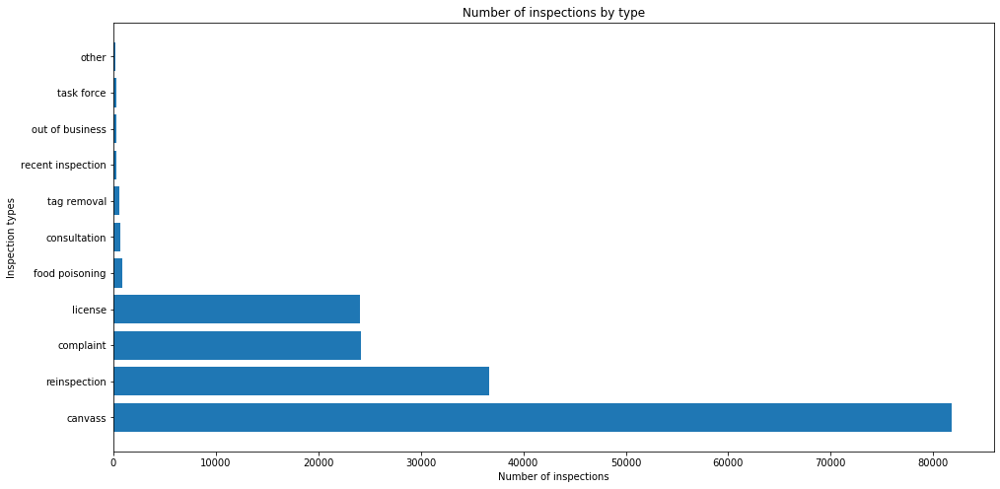

In [82]:
inspection_count=food["Inspection Type"].value_counts()
fig ,ax=plt.subplots(figsize=(16,8))
ax.set_title("Number of inspections by type")
ax.set_xlabel("Number of inspections")
ax.set_ylabel("Inspection types")
_=ax.barh(inspection_count.index,inspection_count.values)

In [83]:
# We count the number pf inspections by type and year
year_inspection_type = pd.DataFrame(food.groupby(['Year','Inspection Type'])['Inspection ID'].count()).reset_index()

year_inspection_type = year_inspection_type.pivot(index='Year', values='Inspection ID', columns='Inspection Type')

year_inspection_type.fillna(0, inplace=True)

year_inspection_type.head()

Inspection Type,canvass,complaint,consultation,food poisoning,license,other,out of business,recent inspection,reinspection,tag removal,task force
Year,,,,,,,,,,,
2010,7006.0,2920.0,236.0,233.0,2705.0,149.0,285.0,22.0,3437.0,258.0,106.0
2011,7548.0,2880.0,136.0,145.0,2642.0,40.0,1.0,20.0,3680.0,331.0,144.0
2012,6845.0,2743.0,74.0,101.0,2742.0,14.0,0.0,2.0,3462.0,6.0,21.0
2013,8834.0,2198.0,60.0,52.0,2554.0,4.0,0.0,12.0,3344.0,3.0,1.0
2014,10106.0,2261.0,71.0,44.0,2375.0,4.0,0.0,31.0,3720.0,2.0,0.0


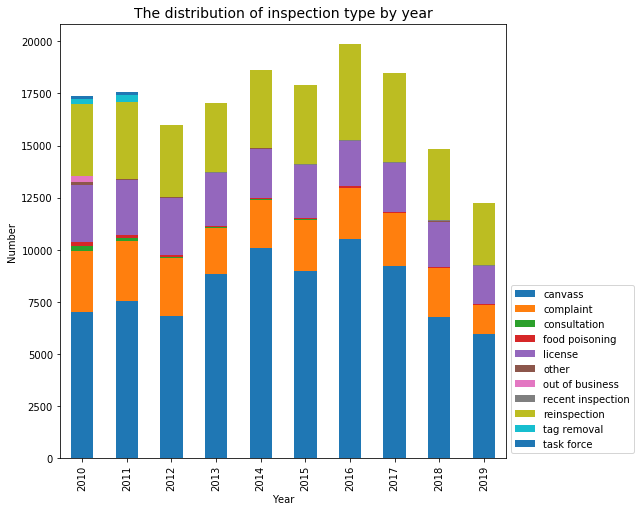

In [84]:
fig, ax = plt.subplots(figsize=(10,10))

year_inspection_type.plot(kind='bar',stacked=True,figsize=(8,8),ax=ax )

plt.legend(loc="lower left", bbox_to_anchor=(1,0))
ax.set_title("The distribution of inspection type by year",size=14)
ax.set_xlabel('Year')
ax.set_ylabel('Number')

plt.show()

We want to focus more on the food poisoning cases: 

#### Food Poisoning

In [85]:
from ipywidgets import interact
food_poisoning_cases= food[food['Inspection Type'] == 'food poisoning']
def plot_(ticker):
    
    fig, ax = plt.subplots(figsize=(10,10))
    
    sns.scatterplot(x='Longitude', y='Latitude', 
                    data=food_poisoning_cases [food_poisoning_cases["Year"]==ticker],ax=ax)
    ax.set_title("The distribution of food poisoning inspection by year",size=20)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('LATITUDE')
    ax.set_ylim([41.6,42.1])
    ax.set_xlim([-88,-87.5])
    
interact(plot_,ticker=widgets.IntSlider(min=2010,max=2019,step=1))


interactive(children=(IntSlider(value=2010, description='ticker', max=2019, min=2010), Output()), _dom_classes…

<function __main__.plot_(ticker)>

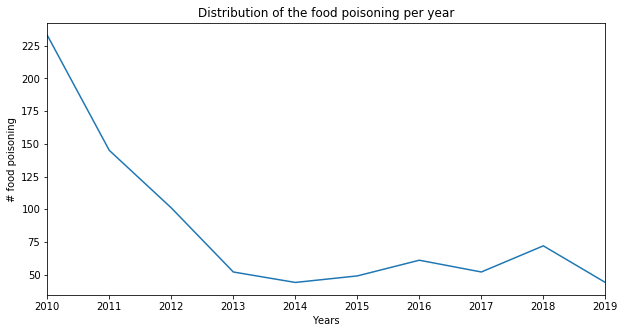

In [86]:
year_inspection_type['food poisoning'].plot(figsize=(10,5))
plt.title("Distribution of the food poisoning per year")
plt.xlabel("Years")
plt.ylabel("# food poisoning")
plt.show()

The number of inspections for food poisoning is interesting and give us some informations.
Indeed, from 2010 to 2014 we observe that while the total number of food inspections increases by a factor of 1.2, 
there is a net decrease (by a factor of 5) of the food poisoning inspections. 

So what did change, several hypohtesis are possible : 
    
    -H0: The detection algorithm improved so that from the number of inspections needed is smaller
    -H1: The inspection had a direct effect and the bad restaurants were closed 

C:\Users\hm.haitham\Anaconda3\lib\site-packages\pandas\core\series.py:1155: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


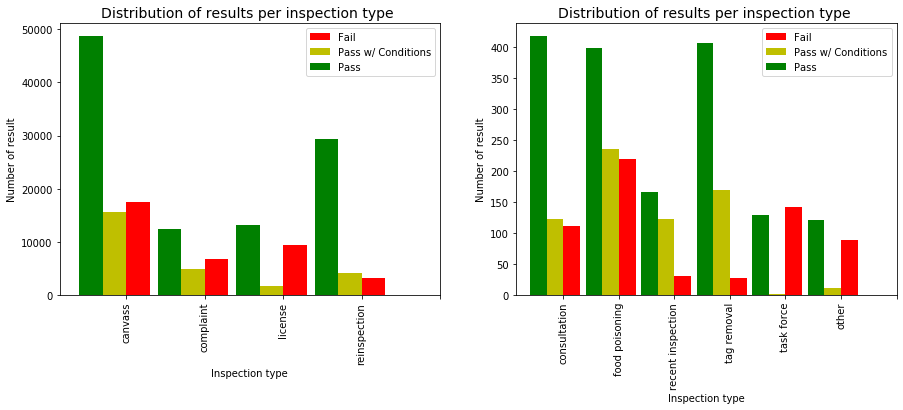

In [87]:
food['Fail'] = food['Results'] == "Fail"
food['Pass'] = food['Results'] == "Pass"
food['Pass w/ Conditions'] =  food['Results'] == "Pass w/ Conditions"

fig = plt.figure(figsize=(15,5))

ax1 = fig.add_subplot(121) 
ax2 = fig.add_subplot(122) 

failures = food.groupby("Inspection Type").sum()['Fail'].copy()
successes = food.groupby("Inspection Type").sum()['Pass'].copy()
condtions = food.groupby("Inspection Type").sum()['Pass w/ Conditions'].copy()

group1 = ['canvass', 'complaint', 'license', 'reinspection','']
group2 = ['consultation' ,'food poisoning', 'recent inspection', 'tag removal', 'task force','other','']

failures[group1].plot(kind ='bar',ax=ax1, color='r',position=0,width=0.3,legend=True)
condtions[group1].plot(kind ='bar', ax=ax1, color='y',position=1,width=0.3,legend=True)
successes[group1].plot(kind ='bar', ax=ax1, color='g',position=2,width=0.3,legend=True)

ax1.set_title("Distribution of results per inspection type ",size=14)
ax1.set_xlabel('Inspection type')
ax1.set_ylabel('Number of result')

failures[group2].plot(kind ='bar',ax=ax2, color='r',position=0,width=0.3,legend=True)
condtions[group2].plot(kind ='bar', ax=ax2, color='y',position=1,width=0.3,legend=True)
successes[group2].plot(kind ='bar', ax=ax2, color='g',position=2,width=0.3,legend=True)

ax2.set_title("Distribution of results per inspection type ",size=14)
ax2.set_xlabel('Inspection type')
ax2.set_ylabel('Number of result')

plt.show()

We are intersted in how food poisoning evolve through time.

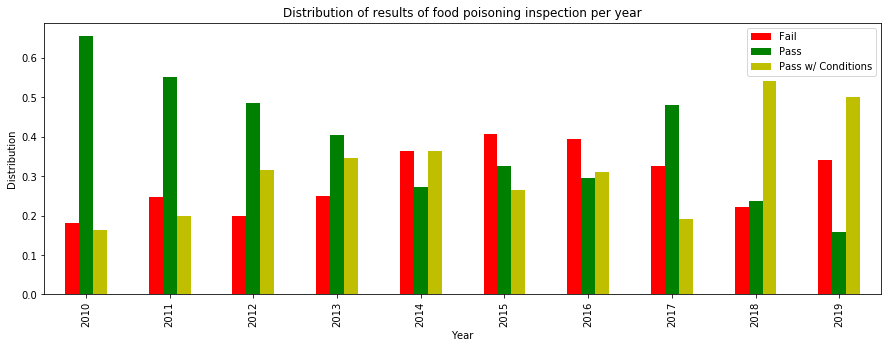

In [88]:
food_poisoning= food[food['Inspection Type'] == 'food poisoning']
categories_food_poisonning= food_poisoning.groupby('Year').sum()[['Fail', 'Pass' , 'Pass w/ Conditions']]
total_numbers= categories_food_poisonning.sum(axis=1)
categories_food_poisonning_norm = categories_food_poisonning/total_numbers.values.reshape((-1,1))

categories_food_poisonning_norm.plot(kind='bar', color= ('r','g', 'y'), figsize = (15,5))
plt.title("Distribution of results of food poisoning inspection per year")
plt.ylabel("Distribution")

plt.show()

### Adress

In [89]:
food["Address"]=food["Address"].str.strip()

### Names

The null values in AKA Name can be replaced with their correspending BDA name

In [90]:
food.loc[food["AKA Name"].isnull(),"AKA Name"] = food.loc[food["AKA Name"].isnull(),"DBA Name"]

In [91]:
# casefold
food["DBA Name"]=food["DBA Name"].str.casefold()
food["AKA Name"]=food["AKA Name"].str.casefold()
# remove anything within paranthesis
food["AKA Name"]=food["AKA Name"].apply(lambda x: re.sub(r'\([^)]*\)', '', x ))
# Let's inspect joint businesses, these have a "/" in their AKA Name
joint=food[["/" in aka for aka in food["AKA Name"]]]["AKA Name"].unique()
joint[0:20]

array(['dunkin donuts/baskin-robbins', 'jewel / osco',
       'south side fuel ctr/dunkin doughnuts',
       'dunkin donuts / baskin robbins', 'catering/main kitchen',
       'dunkin donuts / baskin robins', 'montessori acdy. inft/tod. cnt',
       'cvs/pharmacy #2981', 'kfc/long john silver', 'mayne/act one',
       'italian village / vivere', 'mayne stage/act one cafe',
       'northwest middle/belmont-cragin',
       'collins academy/north lawndale college prep',
       'legno/suparossa carry out', 'am/pm',
       'dunkin  donuts / baskin robbins', 'solo cup co./aramark services',
       'pink monkey / new york strip', "kmart/little caesar's"],
      dtype=object)

In [92]:
# Lots of them are in the form "cvs/pharmacy #xxxxx" so we can fix this 
cvs=food[[aka.startswith("cvs") for aka in food["AKA Name"]]]["AKA Name"].index
food.loc[cvs,"AKA Name"]="cvs"

Let's check if we still have nan values:

In [93]:
null_cols=np.sum(food.isnull() , axis=0)
null_cols[null_cols>0]

Series([], dtype: int64)

# <p style="text-align: center;">Analysing the Yelp Dataset</p>

# <p style="text-align: center;">![Yelp_logo](img/yelp.png)</p>

## 1. Description of the dataset 

[Yelp](https://www.google.com) is a business directory service and crowd-sourced review forum, it focuses on publishing crowd-sourced reviews about businesses. 

To leverage useful data from the Yelp website, we use a combination of [Yelp's API - Yelp Fusion](https://www.yelp.com/fusion) and web scraping in order to get the reviews of the restaurants in Chicago that have been labeled with " food poisoning " during food inspections.

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; a. Data collection

We started by looking into the public dataset offered by Yelp itself in https://www.yelp.com/dataset but unfortunately it didn't contain info about businesses in Chicago. So we decided to take matters in our hands and extract our own dataset.

We started by getting all the businesses that have been labeled with " food poisoning " during inspections from the Chicago Food Inspection dataset, from that list of businesses we requested the Yelp API Match Endpoint with the name of each business and its address to get the unique Yelp alias of the business. In Yelp every business has both a unique ID, such as `4kMBvIEWPxWkWKFN__8SxQ`, as well as a unique alias, such as `yelp-san-francisco`. Generally, business ID and business alias are interchangeable methods of identifying a Yelp Business. The business alias is more human-readable, but often longer, than the business ID. 

From that previously obtained alias, we query the website for `https://www.yelp.com/biz/alias` to obtain all the reviews of a restaurant. That step is costly in terms of time spent since it is easy to get blacklisted from yelp's website. We use different proxies and user agents to gather our data from the website.

The dataset shown here is just a sample of the entire dataset that we will submit for the next milestone, getting all the reviews we want takes time so for now we will do our analysis on 4130 reviews from 123 restaurants that are affected by food poisoning.

We also analyze the dataset containing said restaurants and information about those according to yelp.

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; b. Data description

Here is a brief description in each column of the restaurants dataset :

| Name           | Type   | Description                                                              |
|----------------|--------|--------------------------------------------------------------------------|
| Address        | String | Address of the establishment according to our food inspection dataset    |
| Lincense #     | int    | License number of the establishment according to food inspection dataset |
| Name           | String | Name of the establishment                                                |
| alias          | String | Unique Yelp alias of this business.                                      |
| id             | String | Unique Yelp id of this business                                          |
| is_closed      | bool   | Wether the business has been (permanently) closed                        |
| overall_rating | float  | Rating for this business (value ranges from 1, 1.5, ... 4.5, 5).         |
| price          | string | Price level of the business. Value is one of `$` , `$$`, `$$$`,  `$$$$`          |
| review_count   | int    | Number of reviews for this business.                                     |


The columns for the review dataset is pretty self explanatory, it contains the body of the review, the author of the review, the date for when the review was issued, the rating of the restaurant and a unique identifier for the restaurant ( alias ).



## 2. Loading the data

In [107]:
# all useful imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS # this module is for making wordcloud in python
import re # regular expression
import string # for finding punctuation in text
import nltk # preprocessing text
from collections import Counter 
from textblob import TextBlob

In [128]:
#Import dataset from previously obtained CSV file
restaurants_food_poisoning_reviews = pd.read_csv("data/sample_food_poisoning.csv",index_col=0).drop_duplicates()
restaurants_food_poisoning_reviews.head()

,reviewRating,datePublished,description,author,alias
0,{'ratingValue': 1},2019-09-06,"Grabbed a takeout order tonight on a Friday, p...",Paul S.,picante-taqueria-chicago-2
1,{'ratingValue': 1},2019-08-13,I almost passed out eating here when I found a...,Mariam R.,picante-taqueria-chicago-2
2,{'ratingValue': 1},2019-07-28,First time we ever have gone to Picante and wa...,Maria Guadalupe V.,picante-taqueria-chicago-2
3,{'ratingValue': 1},2019-05-31,Bland. Customer service needs work. Offensive ...,Dana H.,picante-taqueria-chicago-2
4,{'ratingValue': 1},2019-04-22,"Steak burrito ruined my day, stay away! Not t...",Daniel C.,picante-taqueria-chicago-2


In [129]:
#Shape of the dataset
restaurants_food_poisoning_reviews.shape

(4130, 5)

In [187]:
# Importing second dataset including info about the restaurants without the reviews
restaurants_food_poisoning = pd.read_csv("data/restaurant_aliases_food_poisoning_withrating.csv",index_col=0).drop_duplicates()
restaurants_food_poisoning.head()


,Address,License #,Name,alias,id,is_closed,overall_rating,price,review_count
0,2018 W DIVISION ST,2042823.0,picante taqueria,picante-taqueria-chicago-2,EMj-Ke8PAxA0ppWbcsirAg,0.0,3.5,$,336.0
1,2032-2036 W Devon AVE,2423912.0,ghareeb nawaz restaurant,ghareeb-nawaz-chicago,sYzkzjM2upp2vW32vPaJ9w,0.0,4.0,$,807.0
2,7723 S STATE ST,2583156.0,jerk taco man,jerk-taco-man-chicago-5,aInJI0-1j0L1f5BvVgoE4g,0.0,2.5,NaN,47.0
3,1676 W OGDEN AVE,2534801.0,taqueria el rey del taco fashion 1676 inc,su-taqueria-el-rey-del-taco-chicago-5,CeoR8-qNyXf5Rw--IUP3yg,0.0,4.5,NaN,20.0
4,4337 N LINCOLN AVE,45189.0,the northman,the-northman-chicago-2,XWbMHh7WQRu7tEZzIRKEgg,0.0,4.5,$$,235.0


In [188]:
#Shape of the dataset
restaurants_food_poisoning.shape

(94, 9)

## 2. Cleaning the data

In [131]:
# Extract rating from reviewRating then change the type of the column to int
restaurants_food_poisoning_reviews["reviewRating"]=restaurants_food_poisoning_reviews["reviewRating"].str.extract('(\d+)')
restaurants_food_poisoning_reviews = restaurants_food_poisoning_reviews.astype({'reviewRating': 'int32'})
restaurants_food_poisoning_reviews.head()

,reviewRating,datePublished,description,author,alias
0,1,2019-09-06,"Grabbed a takeout order tonight on a Friday, p...",Paul S.,picante-taqueria-chicago-2
1,1,2019-08-13,I almost passed out eating here when I found a...,Mariam R.,picante-taqueria-chicago-2
2,1,2019-07-28,First time we ever have gone to Picante and wa...,Maria Guadalupe V.,picante-taqueria-chicago-2
3,1,2019-05-31,Bland. Customer service needs work. Offensive ...,Dana H.,picante-taqueria-chicago-2
4,1,2019-04-22,"Steak burrito ruined my day, stay away! Not t...",Daniel C.,picante-taqueria-chicago-2


In [132]:
restaurants_food_poisoning_reviews.dtypes

reviewRating      int32
datePublished    object
description      object
author           object
alias            object
dtype: object

In [133]:
# We check for null values in columns
restaurants_food_poisoning_reviews.columns[restaurants_food_poisoning_reviews.isnull().any()].tolist()

[]

In [134]:
# We check for empty strings
restaurants_food_poisoning_reviews.columns[(restaurants_food_poisoning_reviews=='').any()].tolist()

[]

In [167]:
# now to the restaurants info dataset 
restaurants_food_poisoning.dtypes

Address            object
License #         float64
Name               object
alias              object
id                 object
is_closed         float64
overall_rating    float64
price              object
review_count      float64
dtype: object

In [168]:
# We check for null values in columns
restaurants_food_poisoning.columns[restaurants_food_poisoning.isnull().any()].tolist()

['price']

In [203]:
# To deal with the missing values in price we later plot a distribution over the price variable and then decide what do we set it

In [170]:
# We check for empty strings
restaurants_food_poisoning.columns[(restaurants_food_poisoning=='').any()].tolist()

[]

In [171]:
# The id column was only useful for the yelp part, aliases are already a unique identifier and easier to read so we get rid of it
restaurants_food_poisoning = restaurants_food_poisoning.drop(['id'],axis = 1)

In [199]:
# replace dollar sign to get data that can be parsed because dollar signs cause problems in strings
restaurants_food_poisoning = restaurants_food_poisoning.astype({'price': 'str'})
restaurants_food_poisoning['price'] = restaurants_food_poisoning['price'].str.replace('$', '\$')

## 3. Understanding what's in the data

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; a. Distributions

In [135]:
# We get the distribution of reviews over the years
restaurants_food_poisoning_reviews['year_of_review'] = restaurants_food_poisoning_reviews.datePublished.map(lambda x : int(x[:4]))

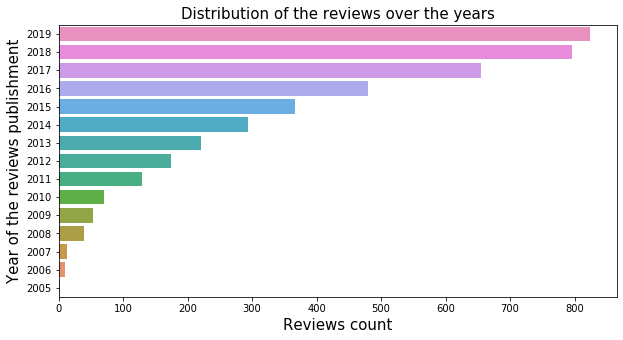

In [136]:
# Plotting the distribution of the reviews over the years
plt.figure(figsize=(10, 5))
p = sns.countplot(data = restaurants_food_poisoning_reviews, y = 'year_of_review', orient="h").invert_yaxis()
plt.title("Distribution of the reviews over the years",fontsize=15)
plt.xlabel('Reviews count',fontsize=15)
plt.ylabel('Year of the reviews publishment',fontsize=15);

In [137]:
# We analyse bad ratings of reviews by getting the restaurants with most bad rating scores. As we work on a sample
# of the data, reviews counts may be lower for some restaurants.
ratings = restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews.reviewRating == 1].groupby(['alias', 'reviewRating']).agg('size').to_frame('count').reset_index().sort_values(by='count', ascending=False)
ratings[:20]

,alias,reviewRating,count
40,fremont-chicago,1,40
12,bbq-supply-chicago-3,1,40
55,lao-sze-chuan-uptown-chicago,1,40
88,river-roast-chicago-3,1,40
34,dolo-restaurant-and-bar-chicago-3,1,40
35,duseks-board-and-beer-chicago-2,1,40
18,borinquen-restaurant-chicago-3,1,40
94,sonic-drive-in-chicago,1,40
15,blaze-n-grill-chicago,1,40
84,picante-taqueria-chicago-2,1,40


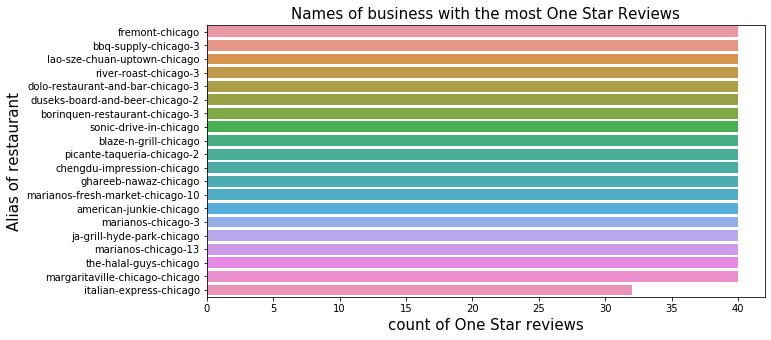

In [138]:
plt.figure(figsize=(10, 5))
#p = sns.barplot(x ='alias', y = 'count', data = ratings[:10], orient="h").invert_yaxis();
p = sns.barplot(data = ratings[:20], x='count', y = 'alias', orient="h")
plt.title("Names of business with the most One Star Reviews",fontsize=15)
plt.xlabel('count of One Star reviews',fontsize=15)
plt.ylabel('Alias of restaurant',fontsize=15);

This plot shows the names of business from the Yelp reviews sample with the most One Star Reviews. Since we are handling a sample, we unfortunately didn't get a clearer ranking in terms of number of One Star Reviews since the number of reviews we have so far is limited. This plot would be more significant when we will work with the entire dataset.

In [185]:
# Now for the restaurants info dataset
# Since the price column contains dollars, we are going to change dollar signs to integers
restaurants_food_poisoning['price'].unique()

array(['$', nan, '$$', '$$$', '$$$$'], dtype=object)

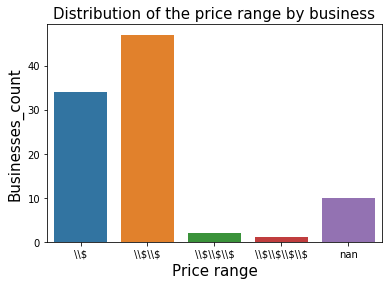

In [220]:
# Plotting the distribution of the price range by business
dat = restaurants_food_poisoning.groupby(['price']).agg('size').to_frame('count').reset_index()
ax = sns.barplot(x="price",y="count", data=dat)
plt.title("Distribution of the price range by business",fontsize=15)
plt.xlabel('Price range',fontsize=15)
plt.ylabel('Businesses_count',fontsize=15);

Here we can see from our sample that the data is right skewed , the restaurants that fail food inspections for food poisoning are more likely to be cheap

In [223]:
# We replace the nans of the price range with the most reprensented value $$
# this can change when we get the whole dataset 
restaurants_food_poisoning['price'] = restaurants_food_poisoning['price'].replace('nan', '\$\$', regex=True)

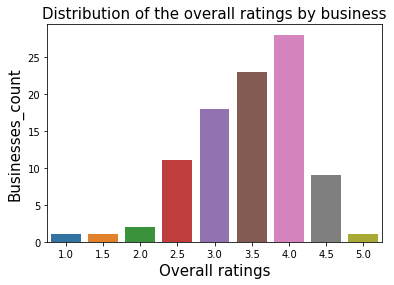

In [207]:
# Plotting the distribution of the overall_ratings by business
dat = restaurants_food_poisoning.groupby(['overall_rating']).agg('size').to_frame('count').reset_index()
ax = sns.barplot(x="overall_rating",y="count", data=dat)
plt.title("Distribution of the overall ratings by business",fontsize=15)
plt.xlabel('Overall ratings',fontsize=15)
plt.ylabel('Businesses_count',fontsize=15);

We can see here that the ratings are left skewed, so restaurants still have good grades despite having had food poisoning

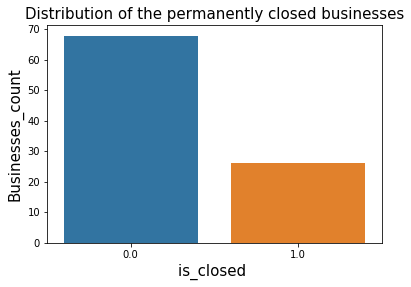

In [226]:
# Plotting the distribution of the overall_ratings by business
dat = restaurants_food_poisoning.groupby(['is_closed']).agg('size').to_frame('count').reset_index()
ax = sns.barplot(x="is_closed",y="count", data=dat)
plt.title("Distribution of the permanently closed businesses",fontsize=15)
plt.xlabel('is_closed ',fontsize=15)
plt.ylabel('Businesses_count',fontsize=15);

 Here 0 means that the restaurant is currently opened and 1 means that the restaurant is permanently closed, we can clearly see from this sample 
that the restaurants that faced food inspections and failed for food poisoning have a high chance of being closed permanently today

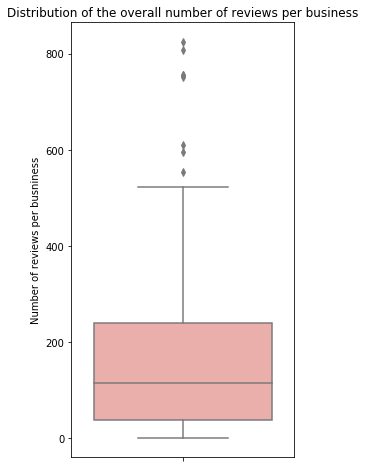

In [216]:
# Plotting the distribution of the overall number of reviews by business
plt.figure(figsize=(4, 8))
sns.boxplot(restaurants_food_poisoning.review_count, 
 orient='v', color='#F6A6A0')
plt.ylabel('Number of reviews per busniness')
plt.title("Distribution of the overall number of reviews per business");

Here we see that most of the restaurants have between 50 and 200 reviews

In [1]:
# We plot the top 10 businesses by number of overall reviews
restaurants_food_poisoning.sort_values(by='review_count', ascending=False)

NameError: name 'restaurants_food_poisoning' is not defined

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; b. Correlations

In [229]:
# Correlation between variables in the restaurants dataset
restaurants_food_poisoning[['is_closed','overall_rating','review_count']].corr()

,is_closed,overall_rating,review_count
is_closed,1.000000,-0.221065,-0.027791
overall_rating,-0.221065,1.000000,0.375824
review_count,-0.027791,0.375824,1.000000


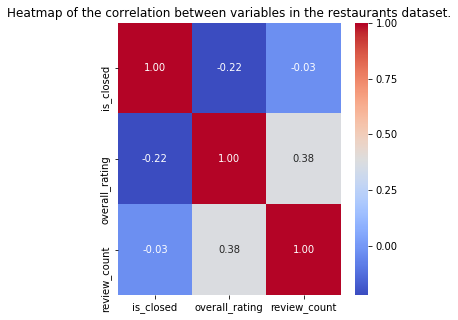

In [233]:
# Plotting the heatmap.
plt.figure(figsize=(5,5))
ax = sns.heatmap(restaurants_food_poisoning[['is_closed','overall_rating','review_count']].corr(), annot=True, fmt=".2f", cmap = "coolwarm")

# This is a small fix to have the heatmap not be cropped on the top and bottom parts.
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
ax.set_title('Heatmap of the correlation between variables in the restaurants dataset.')

ax;

Here we see that the correlation between variables stays relatively low, even though we can see that the higher the review_count is the higher the overall_rating for that restaurant is which makes sense since popular restaurants normally are popular for a "reason" so they may serve at least decent food. We also see that the restaurant that the fact that a restaurant has bad overall rating affects if a restaurant is closed or not.

## 4. Enriching, filtering, transforming the data according to your needs.

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; a. Enriching the data

##### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;  - Detecting the language of reviews

In [139]:
# We detect the language of the reviews for the coming text analysis
from langdetect import detect
restaurants_food_poisoning_reviews["language"] = restaurants_food_poisoning_reviews.description.map(lambda x: detect(x))

In [140]:
# We see that there are to languages, English and Spanish, we delve further to see what comments were actually said in spanish
restaurants_food_poisoning_reviews["language"].unique()

array(['en', 'es'], dtype=object)

In [141]:
restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews["language"] == 'es']['description'].iloc[0]

"Yesterday I went to eat here and the food is excellent I like it but it is unfortunate that they have a manager named CORNELIUS who is racist, I do not let myself eat in the place and I call the police, maybe I have a complex with Hispanics but I do not  blamed the place, maybe they don't even know the serious problems CORNELIUS has inside\n\nayer fui a comer aqui y la comida es excelente me gusta pero es lamentable que tengan un manager de nombre CORNELIUS que es racista, no me dejo comer en el lugar y me llamo a la policia, quiza tenga algun complejo con los hispanos pero no le hecho la culpa al local, quiza no saben aun los graves problemas que tiene CORNELIUS en su interior"

In [142]:
# We see that we only have one review in spanish for this sample, thus we just choose to ignore it for now when we do further text processing
# For the next milestone, when we have complete data, if we see that the numbear of reviews in languages other than english is significant
# we will treat them accordingly, by doing a specific preprocessing to each language according to their respective stopwords and 
# study the relationship between words in all languages.
# For now we focus on the english language since it is difficult to leverage useful data from only one review

restaurants_food_poisoining = restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews["language"] == 'en']

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; b. Transforming the text in reviews to remove noise

In [143]:
# Introduce a preprocessing function to get rid of stopwords in the description of reviews
def preprocess(x):
    x = re.sub('[^a-z\s]', '', x.lower())                  # get rid of noise
    x = [w for w in x.split() if w not in set(stopwords)]  # remove stopwords
    return ' '.join(x) # then join the text again

In [144]:
#Constructing a list of stopwords

#download all stopwords from the nltk library
nltk.download('stopwords')

#get a list of all english stopwords
i = nltk.corpus.stopwords.words('english')

#get a list of all punctuations
j = list(string.punctuation)

stopwords = set(i).union(j)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KaabachiBayrem\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [150]:
# filter the column description according to the stopwords 
restaurants_food_poisoning_reviews["description_filtered"]= restaurants_food_poisoning_reviews.apply(lambda row : preprocess(row["description"]) , axis = 1)
restaurants_food_poisoning

,reviewRating,datePublished,description,author,alias,year_of_review,language,description_filtered
0,1,2019-09-06,"Grabbed a takeout order tonight on a Friday, p...",Paul S.,picante-taqueria-chicago-2,2019,en,grabbed takeout order tonight friday place dea...
1,1,2019-08-13,I almost passed out eating here when I found a...,Mariam R.,picante-taqueria-chicago-2,2019,en,almost passed eating found bug inside steak ta...
2,1,2019-07-28,First time we ever have gone to Picante and wa...,Maria Guadalupe V.,picante-taqueria-chicago-2,2019,en,first time ever gone picante disappointed mind...
3,1,2019-05-31,Bland. Customer service needs work. Offensive ...,Dana H.,picante-taqueria-chicago-2,2019,en,bland customer service needs work offensive pa...
4,1,2019-04-22,"Steak burrito ruined my day, stay away! Not t...",Daniel C.,picante-taqueria-chicago-2,2019,en,steak burrito ruined day stay away worst food ...
...,...,...,...,...,...,...,...,...
455,2,2015-07-29,Service and quality of the food has definitel...,tracy h.,borinquen-lounge-chicago,2015,en,service quality food definitely gone used one ...
456,2,2015-01-28,"Mediocre at best. Had a soup, included bones.....",Jon W.,borinquen-lounge-chicago,2015,en,mediocre best soup included bones broth bland ...
457,2,2014-06-30,"A bit disappointing, I used to love this plac...",Elsi G.,borinquen-lounge-chicago,2014,en,bit disappointing used love place finally deci...
458,2,2014-06-28,The 2 starts are for the service but the food ...,Linda A.,borinquen-lounge-chicago,2014,en,starts service food good jibarito cooked super...


## 4. Deep dive analysis of two businesses that failed food inspections for food poisoning


### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; a. [BBQ Supply Co restaurant](https://www.yelp.com/biz/bbq-supply-chicago-3)

In [152]:
# Get all the reviews of BBQ Supply CO restaurant
bbq_reviews  = restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews.alias == 'bbq-supply-chicago-3']
bbq_reviews.head()

,reviewRating,datePublished,description,author,alias,year_of_review,language,description_filtered
1575,1,2019-09-30,I asked for some extra chips and the guy bring...,JP H.,bbq-supply-chicago-3,2019,en,asked extra chips guy bringing back eating lol...
1576,1,2018-04-29,Tried to order from here. They cancelled my or...,Kim M.,bbq-supply-chicago-3,2018,en,tried order cancelled order store reason calle...
1577,1,2017-12-12,I was hoping to like this place and had a stro...,Tashia A.,bbq-supply-chicago-3,2017,en,hoping like place strong craving bbq days seve...
1578,1,2017-10-21,Well I really had high hopes for this place. ...,Joshua W.,bbq-supply-chicago-3,2017,en,well really high hopes place could give zero s...
1579,1,2017-10-13,Everything was way too smoky...chips...everyth...,Gina L.,bbq-supply-chicago-3,2017,en,everything way smokychipseverything absolutely...


We make a word cloud of BBQ Supply Co restaurant reviews to have an idea about most used words over the reviews

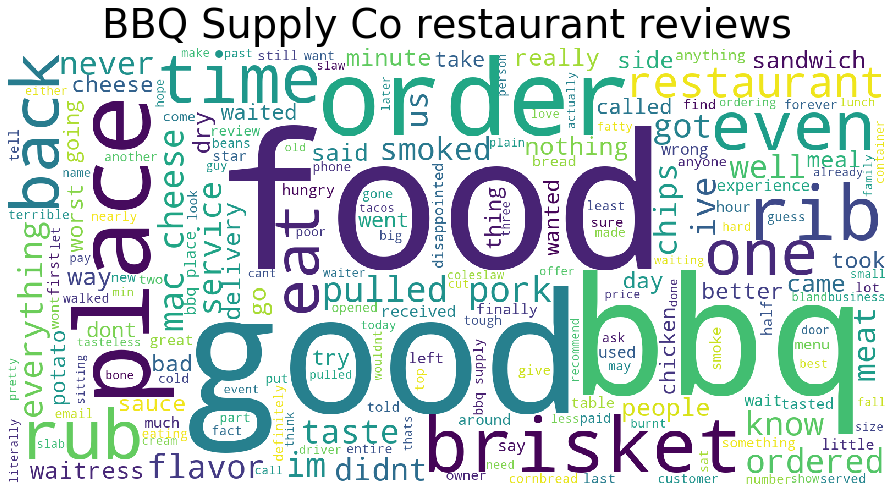

In [153]:
wc = WordCloud(background_color="white",width=1600, height=800, random_state=1, max_words=200)
# Join all strings together from the filtered description column to obtain all review text for the restaurant
wc.generate(' '.join(bbq_reviews['description_filtered']))


plt.figure(figsize=(15,10))
# Add title to figure
plt.title("BBQ Supply Co restaurant reviews", fontsize=40)
plt.imshow(wc)
plt.axis('off')
plt.tight_layout(pad=10)

In [154]:
# We get the 20 most occuring words over the reviews. 

# Pass the split_it list to instance of Counter class. 
splitted = bbq_reviews['description_filtered'].apply(lambda x: x.split()).to_list()
flatten = [item for sublist in splitted for item in sublist]
counter = Counter(flatten) 
  
# most_common() produces k frequently encountered 
# input values and their respective counts. 
most_occur = counter.most_common(20) 
most_occur

[('bbq', 40),
 ('food', 36),
 ('place', 32),
 ('good', 28),
 ('like', 28),
 ('order', 23),
 ('cheese', 23),
 ('brisket', 22),
 ('pulled', 19),
 ('even', 18),
 ('pork', 17),
 ('ribs', 17),
 ('back', 16),
 ('mac', 16),
 ('chips', 15),
 ('one', 15),
 ('time', 15),
 ('eat', 14),
 ('would', 14),
 ('ive', 14)]

Conclusion ==> 

When inspecting the word cloud, we can see some negative words like bad, wrong and disappointed. The 20 most occuring words show us no sign of negative reviews nor food poisoning.

In order to have a sharper view on bad reviews, we make a sentiment analysis over reviews.

Sentiment analysis is the process of computationally identifying and categorizing opinions expressed in a text. Especially we apply this process on our reviews in order to determine whether the writer’s attitude towards a restaurant's service is positive, negative, or neutral. 

In [155]:
#Now we add a column which has the sentiment values of the each review posted for BBQ Supply Co, to see how the 
#author of this review feels about the restaurant.

#Create Text Blob Object and draw out the sentiment of each review by returning a value between -1.0 (extreme negative) 
#and 1.0 (extreme positive).
bbq_reviews['sentiment_analysis'] = bbq_reviews['description_filtered'].apply(lambda x: TextBlob(x).sentiment.polarity)
bbq_reviews = bbq_reviews.sort_values(by='sentiment_analysis', ascending=True)
bbq_reviews[:10]

C:\Users\KaabachiBayrem\.conda\envs\ada\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,reviewRating,datePublished,description,author,alias,year_of_review,language,description_filtered,sentiment_analysis
1601,1,2015-02-20,I just received delivery of a pulled pork sand...,k h.,bbq-supply-chicago-3,2015,en,received delivery pulled pork sandwich mac n c...,-1.000000
1576,1,2018-04-29,Tried to order from here. They cancelled my or...,Kim M.,bbq-supply-chicago-3,2018,en,tried order cancelled order store reason calle...,-0.800000
1594,1,2016-01-03,Literally the worst bbq and worst service at a...,Corie Z.,bbq-supply-chicago-3,2016,en,literally worst bbq worst service restaurant i...,-0.333333
1596,1,2015-06-22,Fatty Brisket with no flavor. St. Louis cut po...,Li S.,bbq-supply-chicago-3,2015,en,fatty brisket flavor st louis cut poor flavor ...,-0.194444
1612,1,2013-06-06,Worst BBQ I've ever had. For a barbecue joint...,Paco R.,bbq-supply-chicago-3,2013,en,worst bbq ive ever barbecue joint st louis sty...,-0.172153
1593,1,2016-04-29,Smelled delish when we walked in the door. But...,Nancy T.,bbq-supply-chicago-3,2016,en,smelled delish walked door went hill sat back ...,-0.171429
1591,1,2016-06-01,My brother and I came here last month and it w...,Charisse B.,bbq-supply-chicago-3,2016,en,brother came last month extremely disappointin...,-0.161966
1603,1,2014-12-19,"The stale vinegar odor got me first, before I ...",Barbara N.,bbq-supply-chicago-3,2014,en,stale vinegar odor got first even opened styro...,-0.090833
1585,1,2017-04-06,I'll give BBQ Supply at least one star since I...,Nigel P. C.,bbq-supply-chicago-3,2017,en,ill give bbq supply least one star since cant ...,-0.074306
1588,1,2017-03-31,"I used to love this place when it was Rubs, at...",Holly T.,bbq-supply-chicago-3,2017,en,used love place rubs ate many times took cooki...,-0.068366


Here is the first top 5 most negative reviews to BBQ Supply Co restaurant : 
    
    o I just received delivery of a pulled pork sandwich and Mac 'n' cheese ... One minute after eating it I promptly vomited. All I could taste was liquid smoke.  I threw the rest of my lunch. Disgusting.
    
    o Tried to order from here. They cancelled my order in store for no reason. I called and they said they could re-take it but the money I paid for with my card is already gone, waiting 3-5 business days for a refund, that's stupid.
    
    o Literally the worst bbq and worst service at a restaurant I\'ve ever had. Let me start by saying I love smoked bbq. I\'ve eaten at dozens of bbq restaurants over the country and have smoked my own meat as well. I\'m no expert at bbq but I definitely enjoying eating it. However, the food here tasted like cigarette smoke - not bbq smoke. I couldn\'t swallow or even stand the smell of this ashtray food. The worst part of the whole experience is that when I complained to the server about the food she said "there\'s nothing wrong with that food". I told her it\'s awful and won\'t eat it. She said I didn\'t have to eat it but I would still have to pay for it. After arguing with the manager on duty, they refused to change my bill or offer me something else to eat. I reluctantly paid the bill for food I didn\'t eat (left it on the table with only about 4 bites taken) and walked out hungry. I\'ve never experienced such ignorance from a business. Definitely will not return.
    
    o Fatty Brisket with no flavor. St. Louis cut poor flavor. What do they have against salt. Over priced, over rated and typical White folks BBQ. If Bubba ain't on the pit or seasoning the  meat then Bye. If anyone in the Kitchen have no roots past Virginia then say hello to average mac, corn bread and any thing else that goes well with BBQ. Another rip off
    
    o Worst BBQ I've ever had.  For a barbecue joint having only St. Louis Style Ribs is a major oversight.  Baby Backs should at least be an option.  I could even forgive the lack of Baby Back Ribs option if the overpriced St. Louis Style Ribs were actually good but they aren't.  I ordered a full slab and was met with ribs that were tasteless and tough as tire rubber.  Bread on the side, which in all other rib shacks equals a slice of white bread, consisted of a sandwich bun.  Seriously?!  Don't look for Fries or anything else needing a deep fryer on the menu either because they lack a deep fryer.  My wife was disappointed in her dry pulled pork sandwich as well.  The BBQ sauces were locked tighter than Fort Knox in their containers and nearly impossible to extricate.  Presentation was poor as well.  The full slab was cut up into individual ribs and placed into a paper holding tray.  No where on the metal tray was there anywhere to discard the rib bones.  They teach cooking classes at Rub as well which shouldn't be allowed considering the quality of their food.  Overall, a very poor example of BBQ.  I suggest Hecky's, Uncle Willy's, or Uncle John's if you want quality ribs in Chicago.
    
    

When reading the first review with -1 sentiment value, we detect a food poisoning sign: 'One minute after eating it I promptly vomited. All I could taste was liquid smoke'. 

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; b. [Margaritaville restaurant](https://www.yelp.com/biz/margaritaville-chicago-chicago	)

In [156]:
# Get all the reviews of BBQ Supply CO restaurant
margaritaville_reviews = restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews.alias == 'margaritaville-chicago-chicago']
margaritaville_reviews.head()

,reviewRating,datePublished,description,author,alias,year_of_review,language,description_filtered
420,1,2019-11-08,The people who work here do not want customers...,Ann F.,margaritaville-chicago-chicago,2019,en,people work want customers sign read gone fish...
421,1,2019-11-08,Wow! Just walked in. Not busy at all! Total...,Michelle F.,margaritaville-chicago-chicago,2019,en,wow walked busy totally ignored walked saw ple...
422,1,2019-11-08,"We had 2 small grandchildren with us, asked wh...",Judy K.,margaritaville-chicago-chicago,2019,en,small grandchildren us asked kids menus waitre...
423,1,2019-10-23,We waited for some time and the waitress came ...,Thomas L.,margaritaville-chicago-chicago,2019,en,waited time waitress came said would serve us ...
424,1,2019-09-28,So I sent an email out about my horrible exper...,Jacqueline R.,margaritaville-chicago-chicago,2019,en,sent email horrible experience lady first seem...


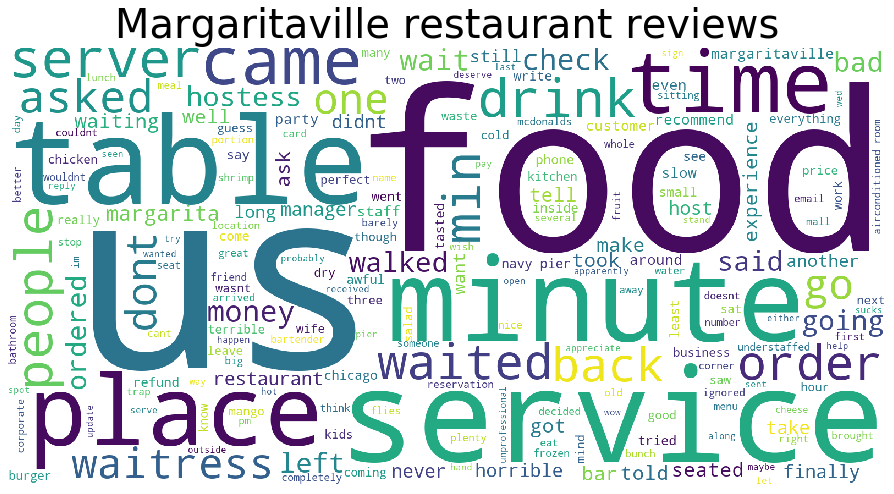

In [157]:
wc = WordCloud(background_color="white",width=1600, height=800, random_state=1, max_words=200)
# Join all strings together from the filtered description column to obtain all review text for the restaurant
wc.generate(' '.join(margaritaville_reviews['description_filtered']))


plt.figure(figsize=(15,10))
# Add title to figure
plt.title("Margaritaville restaurant reviews", fontsize=40)
plt.imshow(wc)
plt.axis('off')
plt.tight_layout(pad=10)

In [158]:
# We get the 20 most occuring words over the reviews. 

# Pass the split_it list to instance of Counter class. 
splitted = margaritaville_reviews['description_filtered'].apply(lambda x: x.split()).to_list()
flatten = [item for sublist in splitted for item in sublist]
counter = Counter(flatten) 
  
# most_common() produces k frequently encountered 
# input values and their respective counts. 
most_occur = counter.most_common(20) 
most_occur

[('us', 35),
 ('food', 33),
 ('service', 22),
 ('would', 20),
 ('minutes', 19),
 ('place', 17),
 ('came', 17),
 ('like', 15),
 ('people', 14),
 ('time', 14),
 ('server', 14),
 ('table', 13),
 ('waited', 13),
 ('back', 12),
 ('asked', 11),
 ('waitress', 11),
 ('go', 11),
 ('one', 11),
 ('dont', 11),
 ('min', 11)]

When inspecting the word cloud, we can see some negative words like bad, awful and slow. The 20 most occuring words show us no sign of negative reviews nor food poisoning.

In order to have a sharper view on bad reviews, we make a sentiment analysis over reviews.

In [159]:
#Now we add a column which has the sentiment values of the each review posted for Margaritaville, to see how the 
#author of this review feels about the restaurant.

#Create Text Blob Object and draw out the sentiment of each review by returning a value between -1.0 (extreme negative) 
#and 1.0 (extreme positive).
margaritaville_reviews['sentiment_analysis'] = margaritaville_reviews['description_filtered'].apply(lambda x: TextBlob(x).sentiment.polarity)
margaritaville_reviews = margaritaville_reviews.sort_values(by='sentiment_analysis', ascending=True)
margaritaville_reviews[:10]

C:\Users\KaabachiBayrem\.conda\envs\ada\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,reviewRating,datePublished,description,author,alias,year_of_review,language,description_filtered,sentiment_analysis
449,1,2018-11-06,Had a horrible experience here. Waited a hour ...,Ryan D.,margaritaville-chicago-chicago,2018,en,horrible experience waited hour disgusting san...,-0.866667
432,1,2019-07-11,Don't go here. The hostess has a terrible att...,Joey B.,margaritaville-chicago-chicago,2019,en,dont go hostess terrible attitude walked walke...,-0.456250
440,1,2019-05-26,Horrible and slow service...waited over 15 min...,Nisha L.,margaritaville-chicago-chicago,2019,en,horrible slow servicewaited minutes waitress e...,-0.433333
435,1,2019-06-20,Absolutely horrible service. Must have caught ...,Jeff B.,margaritaville-chicago-chicago,2019,en,absolutely horrible service must caught shift ...,-0.313462
447,1,2018-12-27,"The food was cold, the service was awful and w...",Carlos T.,margaritaville-chicago-chicago,2018,en,food cold service awful constantly ask water n...,-0.295000
423,1,2019-10-23,We waited for some time and the waitress came ...,Thomas L.,margaritaville-chicago-chicago,2019,en,waited time waitress came said would serve us ...,-0.275000
445,1,2019-01-21,Our waitress was awful. She had a passive aggr...,Katelynn B.,margaritaville-chicago-chicago,2019,en,waitress awful passive aggressive attitude who...,-0.237500
458,1,2018-07-07,Their hosts were completely confused when seat...,Alyssa M.,margaritaville-chicago-chicago,2018,en,hosts completely confused seating us called us...,-0.213333
453,1,2018-08-17,"Overpriced garbage food! Bad service, long ser...",S D.,margaritaville-chicago-chicago,2018,en,overpriced garbage food bad service long servi...,-0.203750
451,1,2018-10-28,Nice waitress. Absolutely awful food: tasteles...,jenn H.,margaritaville-chicago-chicago,2018,en,nice waitress absolutely awful food tasteless ...,-0.180000


Let's look at those reviews and detect those related to food poisoning

   o Grabbed a takeout order tonight on a Friday, place was dead and every employee was a joke. Took 20 mins for 2 veggie tacos and employees were dying laughing about how they unplugged the GrubHub device and all the GrubHub orders we're calling the phone to get refunds and they would hang up and cuss them out. Food was subpar. 3 people working on Friday night for a place that can probably seat 50 people. Unsurprisingly they had 4 customers. Shame on me for even trying the place.
     
   o I almost passed out eating here when **I found a bug INSIDE my steak taco** ... the chicken tacos were really dry and bland. The steak was good but omg the fact that **something was crawling inside it**.

    
   o Bland. Customer service needs work. Offensive patrons. **My chips and salsa was served in a ziplock bag** . A generic one...
     
   o Steak burrito ruined my day, stay away!  Not the worst **food poisoning** I've ever had but pretty **bad**.  Wouldn't come back ever.
     
   o Useless. This place used to be great. Now they don't answer their phone, their message box is full, and their employees don't know how to operate the credit card machine. Why bother...
     
     
   o I literally live right across the street and I would rather get in my car and go get tacos or not eat them at all. Way over priced for what you get and they aren't even good. I wouldn't even pay 1 dollar for them let alone almost 4 dollars. Insane.
     
     
   o As I am sitting here **disgusted** by what I jut consumed. The order of nachos without meat, intentionally I did not order meat to avoid the extra heavy feeling after eating. 
     My order consisted of a massive order of chips, black beans, salsa, shredded cheese, a corner of sour cream & sliced avocado per my request & jalapeños. Flavorless is the biggest disappointment, beans no flavor, Salsa no flavor. I would not have enjoyed this if I was hung over. 
     I came here per recommendation from a business down the street that was servicing my car. Never again. 
     As people were walking in to order food, I wanted to ask, "what are you eating here & what does it taste like?".
     I was actually headed to The Girl & Goat Diner, but came here out of convenience. I know next time.


Conclusion : 
    
For further work we will construct our own dictionary of words related to food poisoning, that allow us easily pinpoint reviews that may show us signs of food poisoning in a restaurant.

## Informed Plan

### Food Chain investigation

**Are food chains in different areas more prone to food inspections failure than the same food chains in other areas ?**

To answer this question, we will analyze the geographical distribution of risk, types of inspection, inspection result and violation type. 
We have shown that this is possible to do as we did it for the entire data and we want to do this now for the specific case of food chains in order to conclude whether these characteristics change depending on location within the same food chain. 

### Chicago Tribune article

**Can we assess how real Chicago Tribune's critics are ?**

To answer this question, first we will separate the establishments by risk category and then we will observe the frequency of inspections and how the inspection's result impact the next inspection.Secondly, we will look at whether there has been a notable change in the inspection behavior past the article publication's date.
The article asks an important question "Does Chicago need more inspectors or more realistic rules ?". Therefore, we will try to answer this question by comparing the impact of the frequency of the previous investigation and the previous violation assigned on the next result.
For the inspections' frequency we can see by how much the probability of a complaint or food poisoning investigation changes with the time interval between inspections.
For the "rules" criteria we can look at the most common reported violations in passed inspections before a business fails and assess how critical their impact is.

# Dataset Visualization

In [372]:
insps=food.groupby(["Inspection Type","Results"])["Inspection ID"].count()

dict_keys=list(insps.to_dict().keys())
lbs=[]
prts=[]
ids2=[]
for i in range(len(dict_keys)):
    prts.append(dict_keys[i][0])
    lbs.append(dict_keys[i][1])
    ids2.append(dict_keys[i][0]+"_"+dict_keys[i][1])

insp_types=prts[0::3]

insp_vals=[]

for type_ in insp_types:
    insp_vals.append(insps[type_].values.sum())
    
fig1 =go.Figure(go.Sunburst(
    ids=np.concatenate((["Inspections"],insp_types,ids2)),
    labels=np.concatenate((["Inspections"],insp_types,lbs)),
    parents=np.concatenate(([""],np.repeat("Inspections",len(insp_types)),prts)),
    values=np.concatenate(([sum(insp_vals)],insp_vals,insps.values)),
    branchvalues="total",
    hovertext=["",
               "The most common type of inspection performed at a frequency relative to the risk of the establishment",
               "Done in response to a complaint against the establishment",
               "Done at the request of the owner prior to the opening of the establishment",
               "Done in response to one or more persons claiming to have gotten ill from eating in the establishment",
               "Done as a requirement for the establishment to receive its license to operate",
               "These are very specific inspections, we labeled them as other",
               "The place is out of business at the time of the inspection",
               "Done when the place already had an inspection a few days before",
               "Done when the place failed the last inspection",
               "Done to evaluate whether the business tag should be removed",
               "Done for a bar or a tavern"]
))
fig1.update_layout(margin = dict(t=50, l=0, r=0, b=0),title_text="Inspection types and their results")


In [373]:
nested_pie=food.groupby(["Risk","Facility Type"])["Inspection ID"].count()

nested_pie_1=nested_pie["Risk 1 (High)"]
nested_pie_1=nested_pie_1[nested_pie_1>100]
nested_pie_2=nested_pie["Risk 2 (Medium)"]
nested_pie_2=nested_pie_2[nested_pie_2>100]
nested_pie_3=nested_pie["Risk 3 (Low)"]
nested_pie_3=nested_pie_3[nested_pie_3>100]

Risks=["Risk 1 (High)","Risk 2 (Medium)","Risk 1 (Low)"]
Insp=["Facilities"]
root=[""]
risk_vals=[sum(nested_pie_1.values),sum(nested_pie_2.values),sum(nested_pie_3.values)]
insp_val=[sum(risk_vals)]
labels=np.concatenate((Insp,Risks,nested_pie_1.index,nested_pie_2.index,nested_pie_3.index))
parents=np.concatenate((root,Insp,Insp,Insp,np.repeat("Risk 1 (High)",len(nested_pie_1)),
                            np.repeat("Risk 2 (Medium)",len(nested_pie_2)),
                            np.repeat("Risk 1 (Low)",len(nested_pie_3))))
values=np.concatenate((insp_val,risk_vals,nested_pie_1.values,nested_pie_2.values,nested_pie_3.values))

risk_1_ids=(nested_pie_1.index).map(lambda x: x+ "_1")
risk_2_ids=(nested_pie_1.index).map(lambda x: x+ "_2")
risk_3_ids=(nested_pie_1.index).map(lambda x: x+ "_3")
ids=np.concatenate((Insp,Risks,risk_1_ids,risk_2_ids,risk_3_ids))

fig2 =go.Figure(go.Sunburst(
    ids=ids,
    labels=labels,
    parents=parents,
    values=values,
    branchvalues="total",
    hovertext=["",
    "These "
    "have complex menus with more risky food handling practices. "
    "They are inspected at least twice per year",
    "Thee are a mixture of the two other risk levels. "
    "They are inspected at least once per year",
    "These have food that may "
    "be packaged in a commercially inspected facility. "
    "They are inspected every two years"]
))
fig2.update_layout(margin = dict(t=50, l=0, r=0, b=0), title_text="Risk levels and their corresponding facility types")


### Food chains

In [94]:
food[food["DBA Name"]=="subway"]["AKA Name"].unique()

array(['subway'], dtype=object)

In [95]:
food[food["AKA Name"]=="subway"]["DBA Name"].unique()

array(['subway', 'subway sandwiches and salads', 'subway store  # 25458',
       'subway sandwiches & salads', 'subway  5183', 'subway 14641',
       'the great state fare', 'c-k subway', 'subway 26199',
       'subway-sandwich', 'subway #44541', 'subway sandwich & salads',
       'sub way', 'sandwich & salad', 'subway sandwiches',
       'subway sandwich shop', 'subway restaurant',
       'subway sandwich & salad', 'subway # 26817-309 w. monroe',
       'subway / tcby', 'subway 7709', 'subway 1121', 'subway #25073',
       'subway 3634', 'subway store #30969', 'subway sandwich and salads',
       'subway 10266', 'skyhigh-101', 'subway sanwich shop',
       'subway #51581', 'subway  #38326', 'subway subs and salads',
       'subway sandwiches and salad', 'subway 50886',
       'subway sandwiches & salad', 'subway restaurant #35406',
       'subway 25064', 'lincoln ave subway', 'subway 275',
       'subway at norwegian american hospital', 'subway #4267',
       'subway sandwich', 'subwa

In [96]:
food[food["AKA Name"]=="mcdonalds"]["DBA Name"].unique()

array(['mcdonalds', 'mcdonalds restaurant', 'pma mcd inc', "mcdonald's",
       'mcdonalds restaurant # 14173', "hale family mcdonald's",
       'mcdonalds #335'], dtype=object)

In [97]:
food[food["DBA Name"]=="mcdonalds"]["AKA Name"].unique()

array(['mcdonalds', 'mc donalds', "mcdonald's", 'mcdonalds  '],
      dtype=object)

From these examples we can see that it is easier to identify food chains' establishments by their AKA Name

In [345]:
hardcoding={"kentucky fried chicken": 'kfc',
            "mc donalds":"mcdonalds",
            "mcdonalds restaurant":"mcdonalds" ,
            "dominos pizza":"dominos",
           "subway sandwiches":"subway",
           "chipotle mexican grill":"chipotle",
            "potbelly sandwich works": "potbelly",
            "potbelly sandwich works llc": "potbelly",
           "whole foods market":"whole foods",
           "7eleven":"7 eleven",
            "j  j fish":"jj fish  chicken",
            "quiznos sub":"quiznos",
            "starbucks coffee":"starbucks",
            "donutsbaskin":"donuts baskin",
            'Harolds Chicken Shack': "Harolds Chicken",
            'Potbelly Llc':"potbelly"
           }
def name_cleaning(x):
    x=re.sub(r'[^\w\s]+', '',x)
    for word, replacement in hardcoding.items():
        x=x.replace(word,replacement)
    x=x.title()
    x=re.sub(" ","",x)
    x=re.sub(r"(\w)([A-Z])", r"\1 \2", x)
    return x

In [346]:
food["AKA Name"]=food["AKA Name"].map(name_cleaning)

In [347]:
# remove punctuation
food["DBA Name"]=food["DBA Name"].str.replace(r'[^\w\s]+', '')
food["DBA Name"]=food["DBA Name"].str.strip()

We can't talk about food in Chicago without mentionning their deep dish pizza, and namely two of their most famous venues: **Giordano's** and **Lou Malnati's** . So let's add them

In [348]:
food[["Malnati" in aka for aka in food["AKA Name"]]]["AKA Name"].unique()


array(['Lou Malnatis'], dtype=object)

In [349]:
food["AKA Name"]=food["AKA Name"].str.replace('Lou Malnatis Pizzeria', 'Lou Malnatis')

In [350]:
giordanos=food[["Giordano" in aka for aka in food["AKA Name"]]].index
food.loc[giordanos,"AKA Name"]="Giordanos"

In [351]:
# We look at establishments with the same AKA name and different adresses
food_chains=food.groupby("AKA Name").Address.nunique().sort_values(ascending=False)
# We will retain food chains with 15 or more establishments
food_chains=food_chains[food_chains>15]
food_chains

AKA Name
Subway                          280
Dunkin Donuts                   159
7 Eleven                        110
Mcdonalds                       108
Starbucks                       101
Citgo                            72
Dunkin Donuts Baskin Robbins     69
Cvs                              69
Jimmy Johns                      42
Burger King                      42
Walgreens                        42
Potbelly                         41
Marathon                         41
Harolds Chicken                  38
Bp                               34
Dollar Tree                      33
Chipotle                         33
Kfc                              31
Gateway Newstand                 31
Dominos                          30
Family Dollar                    29
Taco Bell                        26
Pizza Hut                        26
Wendys                           26
Freshii                          23
Wingstop                         22
Au Bon Pain                      21
Shell              

In [352]:
from sklearn.metrics.pairwise import euclidean_distances
# We are interested in food chains that are rather spread out across the city, for that we will assess the pairwise
# distances of establishments within the same food chain
def food_chain_spread(food_chain):
    location=food[food["AKA Name"]==food_chain][["Latitude","Longitude"]]
    dist_mat=euclidean_distances(location,location)
    return np.sum(dist_mat)/(len(location))
food_chain_spread("Subway")

436.22815124500346

In [353]:
spread=pd.Series(food_chains.index).apply(lambda x: food_chain_spread(x))

In [354]:
fc=pd.DataFrame({"Food_chain":food_chains.index,"number_of_establishments":food_chains.values,"spread":spread})

In [355]:
fc.sort_values("spread", ascending=False).head(10)

,Food_chain,number_of_establishments,spread
0,Subway,280,436.228151
3,Mcdonalds,108,282.205929
1,Dunkin Donuts,159,156.132113
2,7 Eleven,110,100.732759
4,Starbucks,101,99.936245
6,Dunkin Donuts Baskin Robbins,69,84.836581
9,Burger King,42,50.560232
23,Wendys,26,45.364857
17,Kfc,31,44.239157
16,Chipotle,33,40.600311


Unsuprisingly, fast food chains dominate the list

In [356]:
name_fc = widgets.Dropdown(
    options = food_filtered['AKA Name'].unique(),
    value ='Subway',
    description='Food Chain:'
)

use_date = widgets.Checkbox(
    description='Date: ',
    value=True,
)

start_year = widgets.IntSlider(
    value=2015,
    min=2010,
    max=2020,
    step=1.0,
    description='From:',
    continuous_update=False
)
 
end_year = widgets.IntSlider(
    value=2015,
    min=2010,
    max=2020,
    step=1.0,
    description='To:',
    continuous_update=False
)

In [214]:
import ipywidgets as widgets

#select the food chain and years
df = food_filtered.copy()

#find the distribution
distribution= df['Inspection Type'].value_counts()
df_distribution = pd.DataFrame(dict(violation_type = distribution.index, count = distribution.values) ).sort_values(by=['violation_type'])
    
fig = px.line_polar(data_frame=df_distribution, r='count', theta='violation_type', line_close=False)
fig.update_traces(fill='toself')


# Assign an empty figure widget witha trace
g = go.FigureWidget(data=fig,
                    layout=go.Layout(
                        title=dict(
                            text='Food chain profile'
                        )
                    ))

#alter the figure depending on the widgets 
def response(change):
    if use_date.value:
        filter_list = [i and j and k for i, j, k in
                       zip(food_filtered['AKA Name'] == name_fc.value, food_filtered['Year'] >= start_year.value,
                           food_filtered['Year'] <= end_year.value)]
        temp_df = food_filtered[filter_list]
    else:
        temp_df = food_filtered[food_filtered['AKA Name'] == name_fc.value]    
   
    #find the distribution
    temp_distribution= temp_df['Inspection Type'].value_counts()
    temp_df_distribution = pd.DataFrame(dict(violation_type = temp_distribution.index, count = temp_distribution.values) ).sort_values(by=['violation_type'])
    
    with g.batch_update():
        g.data[0].r = temp_df_distribution['count']       
        g.data[0].theta = temp_df_distribution['violation_type']
        
#observe the wdigets 
name_fc.observe(response, names="value")
use_date.observe(response, names="value")
start_year.observe(response, names="value")
end_year.observe(response, names="value")

In [215]:
container = widgets.HBox(children=[use_date,start_year,end_year])
ensemble = widgets.VBox([name_fc,container, g])
ensemble


In [218]:
from sklearn.metrics.pairwise import euclidean_distances
import networkx as nx
import ipywidgets as widgets
def plot_(ticker_name, ticker_type, ticker_start_year, ticker_end_year, ticker_connection):
    
    #Selection on the years, inpection type and food chain's name 
    if(ticker_type == 'All'):
        restaurants =  food_filtered[(food_filtered['Year'] >= ticker_start_year) & (food_filtered['Year'] <= ticker_end_year) 
                                  & (food_filtered['License #'] != 0.0) & (food_filtered['AKA Name'] == ticker_name)].groupby(['License #']) 
    else:
        restaurants =  food_filtered[(food_filtered['Year'] >= ticker_start_year) & (food_filtered['Year'] <= ticker_end_year) 
                                    & (food_filtered['License #'] != 0.0) & (food_filtered['AKA Name'] == ticker_name)
                                    & (food_filtered['Inspection Type'] == ticker_type)].groupby(['License #']) 
    
    #number of inspection done for the size of the nodes
    number_of_inspection = restaurants.count()['Inspection ID']
    
    #Unique value per License#
    restaurants = restaurants[['Longitude','Latitude','Zip', 'Fail','Pass','Pass w/ Conditions', 'Risk number']].mean()
    
    #Addign the name of food Chain
    rest_name = []
    for license_nbre in restaurants.index:
         rest_name.append(food_filtered[food_filtered["License #"] == license_nbre]["AKA Name"].unique()[0])
    
    restaurants['Food Chain'] = rest_name
    
    
    #Creation of the graph and nodes
    G = nx.Graph()
    G.add_nodes_from( range(0,len(restaurants)) )

    #Creation of the edges 
    for index, resto in enumerate(restaurants.values):

        if index != len(restaurants.values)-1:    #because last node does'nt add an edge :) 

            rest_pos = resto[0:2].reshape((-1,2))  #Position of the restaurant
            
            edges = []
            min_distance = 10000
            min_j = index

            for j in range(index+1,len(restaurants) ): 

                #Choice on how to connect the nodes: samme Zip or same FoodChain
                if((ticker_connection == 'Zip code' and restaurants.iloc[index, 2] == restaurants.iloc[j, 2])  
                  or (ticker_connection == 'Food Chain' and restaurants.iloc[index, 7] == restaurants.iloc[j, 7]) ):  
                        
                    other_rest_pos = [ [restaurants.iloc[j, 0 ],restaurants.iloc[j, 1 ]] ] 

                    distance = euclidean_distances(other_rest_pos,rest_pos)

                    if(distance[0,0] < min_distance and distance[0,0] > 0):
                        min_distance = distance[0,0]
                        min_j = j

            if(min_j != index ) :           
                edges.append( (index,min_j,distance) )
                G.add_weighted_edges_from(edges)

    plt.figure(figsize=(8, 8))
    nx.draw(G, node_size=number_of_inspection*50/(ticker_end_year-ticker_start_year +1), pos=restaurants[['Longitude','Latitude']].values ,  node_color = list(restaurants['Pass'].values), cmap=plt.cm.RdYlGn, )  #must change pos 
    plt.title('Probabilty to pass clustered by zip code for the food chain {0} from {1} to {2}'.format(ticker_name,ticker_start_year,ticker_end_year))
    plt.show()

In [219]:
name_fc = widgets.Dropdown(
    options = food_filtered['AKA Name'].unique(),
    value ='Subway',
    description='Food Chain:'
)

inpection_type = widgets.Dropdown(
    options = np.append(food_filtered['Inspection Type'].unique(),'All'),
    value ='All',
    description='Inspection Type :'
)

start_year = widgets.ToggleButtons(
    options=range(2010,2020),
    description='From:',
)
 
end_year = widgets.ToggleButtons(
    options=range(2010,2020),
    description='To:',
)

connection = widgets.RadioButtons(
    options=['Zip code', 'Food Chain'],
    value='Zip code',
    description='Connection:',
)

In [221]:
%matplotlib inline
interact(plot_, ticker_name = name_fc, ticker_type = inpection_type,
         ticker_start_year = start_year, ticker_end_year = end_year, ticker_connection = connection)

interactive(children=(Dropdown(description='Food Chain:', index=6, options=('7 Eleven', 'Dunkin Donuts', 'Citg…

<function __main__.plot_(ticker_name, ticker_type, ticker_start_year, ticker_end_year, ticker_connection)>

In [244]:
def majority(row):
    if((row[0]==0) & (row[1] == 0) & (row[2] == 0)):
        return 'Unknown'
    return row.idxmax()

In [247]:
from collections import OrderedDict
from math import log, sqrt
import numpy as np
import pandas as pd
from six.moves import cStringIO as StringIO
from bokeh.models import Select
from bokeh.plotting import figure, show, output_file,save
from bokeh.layouts import column

In [248]:
def plot_graph(fc_name='Subway'):
    
    #select the correct dataframe with AKA Name new 
    food_filtered_fc_year = food_filtered[(food_filtered['AKA Name'] == fc_name)]
    failures = food_filtered_fc_year.groupby("Inspection Type").sum()['Fail']
    successes = food_filtered_fc_year.groupby("Inspection Type").sum()['Pass']
    conditions = food_filtered_fc_year.groupby("Inspection Type").sum()['Pass w/ Conditions']
    
    df = pd.concat([failures,conditions,successes],axis=1)
    df ['Category'] = df.apply(majority,axis=1)
    df.reset_index(inplace= True)    #df with columns (Inspection Type, Fail, Pass x/ conditons, Pass, Category)
    
    #plot
    result_color = OrderedDict([
        ("Fail","red"),
        ("Pass w/ Conditions", "yellow"),
        ("Pass","forestgreen" ),
    ])

    category_color = OrderedDict([
        ("Pass", "limegreen"),
        ("Pass w/ Conditions", "khaki"),
        ("Fail", "lightcoral"),
        ("Unknwon","lightgray")
    ])

    width = 800
    height = 800
    inner_radius = 90
    outer_radius = 300 - 10

    maxr = sqrt(log(1 * 1E4))
    minr = sqrt(log(1000 * 1E4))
    a = (outer_radius - inner_radius) / (minr - maxr)
    b = inner_radius - a * maxr

    def rad(mic):
        return (a * np.sqrt(np.log(mic * 1E4)) + b)

    big_angle = 2.0 * np.pi / (len(df) + 1)
    small_angle = big_angle / 7

    p = figure(plot_width=width, plot_height=height, title="Distribution of inspection type for the food chain {0}".format(fc_name),
        x_axis_type=None, y_axis_type=None,
        x_range=(-420, 420), y_range=(-420, 420),
        min_border=0, outline_line_color="white",
        background_fill_color="#f0e1d2")

    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None

    # annular wedges
    angles = np.pi/2 - big_angle/2 - df.index.to_series()*big_angle
    colors = [category_color[c] for c in df.Category]
    p.annular_wedge(
        0, 0, inner_radius, outer_radius+57, -big_angle+angles, angles, color=colors,
    )

    # small wedges
    p.annular_wedge(0, 0, inner_radius, rad(df.Fail),
                    -big_angle+angles+5*small_angle, -big_angle+angles+6*small_angle,
                    color=result_color['Fail'])
    p.annular_wedge(0, 0, inner_radius, rad(df['Pass w/ Conditions']),
                    -big_angle+angles+3*small_angle, -big_angle+angles+4*small_angle,
                    color=result_color['Pass w/ Conditions'])
    p.annular_wedge(0, 0, inner_radius, rad(df.Pass),
                    -big_angle+angles+1*small_angle, -big_angle+angles+2*small_angle,
                    color=result_color['Pass'])

    # circular axes and lables
    labels = np.power(10.0, np.arange(0, 5))
    radii = a * np.sqrt(np.log(labels * 1E4)) + b
    p.circle(0, 0, radius=radii, fill_color=None, line_color="white")
    p.text(0, radii, [str(r) for r in labels],
           text_font_size="8pt", text_align="center", text_baseline="middle")

    # radial axes
    p.annular_wedge(0, 0, inner_radius, outer_radius+57,
                    -big_angle+angles, -big_angle+angles, color="black")

    # Inspection Type labels
    xr = radii[-1]*np.cos(np.array(-big_angle/2 + angles))
    yr = radii[-1]*np.sin(np.array(-big_angle/2 + angles))
    label_angle=np.array(-big_angle/2+angles)
    label_angle[label_angle < -np.pi/2] += np.pi # easier to read labels on the left side
    p.text(xr, yr, df['Inspection Type'], angle=label_angle,
           text_font_size="12pt", text_align="center", text_baseline="middle")

    # Hand drawn legends 
    p.circle([-40, -40,-40,-40], [-350,-370,-390, -410], color=['limegreen','khaki','lightcoral','lightgray'], radius=5)
    p.text([-30, -30], [-350,-370],  text=["Majority:" + c for c in ['Pass',"Pass w/ Conditions"]],
           text_font_size="7pt", text_align="left", text_baseline="middle")
    p.text([-30, -30], [-390, -410],  text=["Majority:" + c for c in ['Fail',"Unknown"]],
           text_font_size="7pt", text_align="left", text_baseline="middle")

    p.rect([-40, -40, -40], [18, 0, -18], width=30, height=13,
           color=list(result_color.values()))
    p.text([-15, -15, -15], [18, 0, -18], text=list(result_color),
          text_font_size="9pt", text_align="left", text_baseline="middle")
    
    
    show(p)            #to have it locally 
    #save(layout)      #save it as an html file

In [249]:
select = widgets.Dropdown(
    options=food_filtered['AKA Name'].unique().tolist(),
    value ='Subway',
    description='Food Chain:'
)
    
def update(change):
    plot_graph(select.value)
        
select.observe(update, names="value")
select

Dropdown(description='Food Chain:', index=6, options=('7 Eleven', 'Dunkin Donuts', 'Citgo', 'Starbucks', 'Cvs'…

C:\Users\hm.haitham\Anaconda3\lib\site-packages\pandas\core\series.py:856: RuntimeWarning:

divide by zero encountered in log

C:\Users\hm.haitham\Anaconda3\lib\site-packages\pandas\core\series.py:856: RuntimeWarning:

invalid value encountered in sqrt



In [374]:
# we group by zip and count the number of fail/pass that we normalize after
dist_fc = food_filtered.groupby(['AKA Name','Longitude','Latitude']).Results.value_counts().unstack().reset_index().fillna(0)

# We sum up the groups
sums = dist_fc.loc[:, ['Fail','Pass','Pass w/ Conditions']].sum(axis=1).values.reshape((-1,1))

# We normalize them
dist_fc.loc[:,['Fail','Pass','Pass w/ Conditions']]= dist_fc.loc[:,['Fail','Pass','Pass w/ Conditions']] /sums

# We count the number of samples to have an idea about the significance of our statistics
dist_fc['# of samples'] = food_filtered.groupby(['AKA Name','Longitude','Latitude']).Results.count().values

dist_fc.sort_values(ascending = False , by= "# of samples").head(10)
from ipywidgets import interact
from ipywidgets import widgets

def plot_(ticker):
    
    fig, ax = plt.subplots(figsize=(10,10))
    
    g=sns.scatterplot(x='Longitude', y='Latitude',
                    palette=sns.diverging_palette(133,10,n=dist_fc[dist_fc["AKA Name"]==ticker]["Fail"].nunique(),
                                                  sep=1,center="light"), 
                    data=dist_fc[dist_fc["AKA Name"]==ticker],
                    hue="Fail",ax=ax)
    g.legend_.remove()
    ax.set_title("The distribution of food inspection by year",size=20)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('LATITUDE')
    ax.set_ylim([41.6,42.1])
    ax.set_xlim([-88,-87.5])
    

fc_name = widgets.Dropdown(
    options = dist_fc['AKA Name'].unique(),
    value ='Subway',
    description='Food Chain :'
)

interact(plot_,ticker=fc_name)

interactive(children=(Dropdown(description='Food Chain :', index=31, options=('7 Eleven', 'Au Bon Pain', 'Bp',…

<function __main__.plot_(ticker)>

In [400]:
min_resto = 15
min_year=food_filtered["Year"].min()
max_year=food_filtered["Year"].max()
canvass = []
complaint = []
number_of_establishments = []
rest_names = []
rest_exploded= []
year_exploded=[]
x= []
y= []
for name in fc_names:
    number_of_restaurant = food_filtered[food_filtered['AKA Name'] == name]['Address'].nunique()
    if(number_of_restaurant > min_resto ):
        rest_names.append(name)

for name in rest_names:
    current_sum_=0
    current_canvass=0
    current_complaint=0
    number_of_restaurant=0
    yearly_fail=0
    for year in range(min_year,max_year+1):
        
        rest_exploded.append(name)
        year_exploded.append(year)
        if(year in fc_inspectionType_distribtuion[name]):
            sum_= fc_inspectionType_distribtuion[name][year].sum()
        else:
            sum_=0
        current_sum_+=sum_
        number_of_restaurant = food_filtered[(food_filtered['AKA Name'] == name) & (food_filtered["Year"]>=min_year)
                                             & (year>=food_filtered["Year"])]['Address'].nunique()

        number_of_establishments.append(number_of_restaurant)
        if(year in fc_inspectionType_distribtuion[name]):
            if('canvass' in fc_inspectionType_distribtuion[name][year]):
                current_canvass+=fc_inspectionType_distribtuion[name][year]['canvass'].sum()
                
                if ("Fail" in fc_inspectionType_distribtuion[name][year]['canvass']):
                    
                    yearly_fail+=fc_inspectionType_distribtuion[name][year]['canvass']["Fail"]
        
        
            
        if(year in fc_inspectionType_distribtuion[name]):
            if('complaint' in fc_inspectionType_distribtuion[name][year]):
                current_complaint+=fc_inspectionType_distribtuion[name][year]['complaint'].sum()
                
                if ("Fail" in fc_inspectionType_distribtuion[name][year]['complaint']):
                    yearly_fail+=fc_inspectionType_distribtuion[name][year]['complaint']["Fail"]
                    
        if(current_sum_!=0):        
            canvass.append(current_canvass/current_sum_)            
            complaint.append(current_complaint/current_sum_)
        else:
            canvass.append(0)
            complaint.append(0)
        total=(current_canvass+current_complaint)
        if (total!=0):
            y.append((total-2*yearly_fail)/total)
            x.append((current_canvass-current_complaint)/total)
        else:
            x.append(0)
            y.append(0)


preplot=pd.DataFrame({"name":rest_exploded,"canvass":canvass,
          "complaint":complaint,"size":number_of_establishments,"year":year_exploded,"x":x,"y":y})

types={"Subway":"Sandwich Bar","Dunkin Donuts":"Cafeteria","7 Eleven":"Groceries","Mcdonalds":"Fast Food","Starbucks":"Cafeteria",
    "Citgo":"Kiosk","Cvs":"Groceries","Dunkin Donuts Baskin Robbins":"Cafeteria","Burger King":"Fast Food","Walgreens":"Groceries","Jimmy Johns":"Sandwich Bar",
    "Marathon":"Kiosk","Bp":"Kiosk","Dollar Tree":"Groceries","Chipotle":"Sandwich Bar","Kfc":"Chicken","Gateway Newstand":"Groceries","Dominos":"Pizzeria",
    "Family Dollar":"Groceries","Wendys":"Fast Food","Pizza Hut":"Pizzeria","Potbelly":"Sandwich Bar","Taco Bell":"Fast Food","Harolds Chicken":"Chicken",
      "Freshii":"Sandwich Bar","Wingstop":"Chicken","Au Bon Pain":"Sandwich Bar","Shell":"Kiosk","Jj Fish Chicken":"Chicken",
      "Giordanos":"Pizzeria","Popeyes":"Chicken","Corner Bakery Cafe":"Cafeteria","Sharks Fish Chicken":"Chicken",
      "La Michoacana":"Groceries","Mobil":"Kiosk","Jamba Juice":"Cafeteria"}
preplot["Type"]=preplot["name"].apply(lambda x: types[x])

fig=px.scatter(preplot, x="x", y="y", animation_frame="year", animation_group="name",
           size="size",  hover_name="name", labels="name", color="Type",opacity=0.5,
           log_x=False, size_max=40, range_x=[-1.2,1.2], range_y=[-1.2,1.2])
fig.add_trace(go.Scatter(
    x=[-1, 1],
    y=[0,0],
    mode="lines+text",
    name="Inspection Type",
    text=["Complaint","Canvass"],
    textposition="bottom center"
))
fig.add_trace(go.Scatter(
    x=[0,0],
    y=[-1,1],
    mode="lines+text",
    text=["Fail","Pass"],
    name="Result",
    textposition="bottom center"
))
fig.update_layout(
    height=800,
    title_text='Evolution of food chains regarding their type of inspection and corresponding results'
)
py.offline.plot(fig,filename="7ot zok omha ya webmaster.html")
fig.show()

### Preprocessing inspections timelines

In [113]:

grouped_food=food.groupby(["AKA Name","Address"])
bus_res=grouped_food["Results"].apply(list)
bus_date=grouped_food["Inspection Date"].apply(list)
bus_risk=grouped_food["Risk"].unique()
bus_type=grouped_food["Facility Type"].unique()
insp_type=grouped_food["Inspection Type"].unique()

In [114]:
businesses=pd.concat([bus_res,bus_date,bus_risk,bus_type,insp_type],axis=1).reset_index()
businesses.head()

,AKA Name,Address,Results,Inspection Date,Risk,Facility Type,Inspection Type
0,1 China Express Ltd,4248 S WENTWORTH AVE,[Pass],[2010-11-29 00:00:00],[Risk 1 (High)],[restaurant],[canvass]
1,1 Chop Suey,1907 W 87TH ST,"[Fail, Fail, Pass, Pass, Fail, Pass, Pass, Pas...","[2010-07-01 00:00:00, 2010-07-06 00:00:00, 201...",[Risk 1 (High)],[restaurant],"[license, reinspection, complaint, canvass]"
2,1 Chop Suey,2550 W ADDISON ST,"[Pass, Pass w/ Conditions, Fail, Pass, Pass, F...","[2012-05-01 00:00:00, 2012-08-06 00:00:00, 201...",[Risk 1 (High)],[restaurant],"[license, complaint, canvass, reinspection]"
3,1 Chop Suey,4307 W IRVING PARK RD,"[Pass, Pass, Pass, Pass, Pass, Pass, Pass, Fai...","[2010-06-28 00:00:00, 2011-01-05 00:00:00, 201...",[Risk 1 (High)],[restaurant],"[canvass, complaint, reinspection]"
4,1 Chop Suey,7342 S STONY ISLAND AVE,[Pass],[2019-10-22 00:00:00],[Risk 1 (High)],[restaurant],[license]


In [115]:
# We quantify inspection results as follows :
quantifier=lambda y: 1 if y=="Pass" else 0 if y =="Fail" else 0.5
businesses["Quantified Results"]=businesses["Results"].map(lambda x: list(map(quantifier,x)))

In [116]:
businesses["number of fails"]=businesses["Results"].map(lambda x: x.count("Fail"))

In [117]:
# We iterate over the results array, and see whenever we have a fail, what will be the next inspection result
# We also 
passes=[]
time_lapses=[]
def chain(row):
    pass_=[]
    time=[]
    for i in range(len(row["Quantified Results"])-1):
        time.append(row["Inspection Date"][i+1]-row["Inspection Date"][i])
        if (row["Quantified Results"][i]==0):
            pass_.append(row["Quantified Results"][i+1])
    time_lapses.append(time)     
    passes.append(pass_)   
businesses.apply(chain,axis=1)
businesses["passed after failing"]=passes
businesses["time intervals"]=time_lapses
businesses.head()

,AKA Name,Address,Results,Inspection Date,Risk,Facility Type,Inspection Type,Quantified Results,number of fails,passed after failing,time intervals
0,1 China Express Ltd,4248 S WENTWORTH AVE,[Pass],[2010-11-29 00:00:00],[Risk 1 (High)],[restaurant],[canvass],[1],0,[],[]
1,1 Chop Suey,1907 W 87TH ST,"[Fail, Fail, Pass, Pass, Fail, Pass, Pass, Pas...","[2010-07-01 00:00:00, 2010-07-06 00:00:00, 201...",[Risk 1 (High)],[restaurant],"[license, reinspection, complaint, canvass]","[0, 0, 1, 1, 0, 1, 1, 1, 0.5, 1]",3,"[0, 1, 1]","[5 days 00:00:00, 6 days 00:00:00, 177 days 00..."
2,1 Chop Suey,2550 W ADDISON ST,"[Pass, Pass w/ Conditions, Fail, Pass, Pass, F...","[2012-05-01 00:00:00, 2012-08-06 00:00:00, 201...",[Risk 1 (High)],[restaurant],"[license, complaint, canvass, reinspection]","[1, 0.5, 0, 1, 1, 0, 1, 0, 1, 0.5, 1, 0.5, 0.5]",3,"[1, 1, 1]","[97 days 00:00:00, 406 days 00:00:00, 8 days 0..."
3,1 Chop Suey,4307 W IRVING PARK RD,"[Pass, Pass, Pass, Pass, Pass, Pass, Pass, Fai...","[2010-06-28 00:00:00, 2011-01-05 00:00:00, 201...",[Risk 1 (High)],[restaurant],"[canvass, complaint, reinspection]","[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0.5...",4,"[1, 1, 1, 1]","[191 days 00:00:00, 149 days 00:00:00, 326 day..."
4,1 Chop Suey,7342 S STONY ISLAND AVE,[Pass],[2019-10-22 00:00:00],[Risk 1 (High)],[restaurant],[license],[1],0,[],[]


# Chicago Tribune

**Can we assess how real Chicago Tribune's critics are ?**

To answer this question, first we will separate the establishments by risk category and then we will observe the frequency of inspections and how the inspection's result impact the next inspection.Secondly, we will look at whether there has been a notable change in the inspection behavior past the article publication's date.
The article asks an important question "Does Chicago need more inspectors or more realistic rules ?". Therefore, we will try to answer this question by comparing the impact of the frequency of the previous investigation and the previous violation assigned on the next result.
For the inspections' frequency we can see by how much the probability of a complaint or food poisoning investigation changes with the time interval between inspections.
For the "rules" criteria we can look at the most common reported violations in passed inspections before a business fails and assess how critical their impact is.

In [118]:
# We create a unique identifier for each establishment
food["Business ID"]= food.groupby(["AKA Name","Address"]).ngroup()

From the article:

The Chicago Department of Public Health requires "high risk" food establishments, such as restaurants, school and hospital kitchens and day care centers to be inspected twice a year.

In [120]:
food[["restaurant" in facility for facility in food["Facility Type"]]]["Risk"].value_counts()

Risk 1 (High)      92526
Risk 2 (Medium)    21060
Risk 3 (Low)        1116
Name: Risk, dtype: int64

In [121]:
food[["school" in facility for facility in food["Facility Type"]]]["Risk"].value_counts()

Risk 1 (High)      10672
Risk 2 (Medium)      957
Risk 3 (Low)         244
Name: Risk, dtype: int64

In [122]:
food[["hospital" in facility for facility in food["Facility Type"]]]["Risk"].value_counts()

Risk 1 (High)    517
Name: Risk, dtype: int64

In [123]:
food[["daycare" in facility for facility in food["Facility Type"]]]["Risk"].value_counts()

Risk 1 (High)      5479
Risk 3 (Low)         26
Risk 2 (Medium)      20
Name: Risk, dtype: int64

In [124]:
businesses[businesses["Facility Type"].map(lambda x : len(x)>1)]["Facility Type"]

221                    [restaurant, mobile food dispenser]
302                           [Unspecified, grocery store]
332                            [restaurant, grocery store]
340                            [restaurant, grocery store]
354                           [Unspecified, grocery store]
                               ...                        
26013    [children's services facility, daycare (under ...
26253                          [grocery store, restaurant]
26502                  [restaurant, mobile food dispenser]
26504                  [restaurant, mobile food dispenser]
26665            [restaurant, mobile prepared food vendor]
Name: Facility Type, Length: 361, dtype: object

Many businesses changed their facility types, for our further analysis we will restrict ourselves with businesses with unchanged facility type

In [125]:
constant_facility=businesses[businesses["Facility Type"].map(lambda x : len(x)==1)].copy()
constant_facility["Facility Type"]=constant_facility["Facility Type"].map(lambda x: x[0])


In [126]:
constant_facility[constant_facility["Risk"].map(lambda x : len(x)>1)]["Risk"]

28        [Risk 2 (Medium), Risk 3 (Low)]
63          [Risk 1 (High), Risk 3 (Low)]
118         [Risk 1 (High), Risk 3 (Low)]
140         [Risk 1 (High), Risk 3 (Low)]
172         [Risk 1 (High), Risk 3 (Low)]
                       ...               
26546       [Risk 1 (High), Risk 3 (Low)]
26636     [Risk 2 (Medium), Risk 3 (Low)]
26686       [Risk 3 (Low), Risk 1 (High)]
26732    [Risk 2 (Medium), Risk 1 (High)]
26786       [Risk 1 (High), Risk 3 (Low)]
Name: Risk, Length: 561, dtype: object

Within those facilities, some of them had their risk level been changed, so we will restrict ourselves with businesses with unchanged risk level

In [127]:
constant_risk=constant_facility[constant_facility["Risk"].map(lambda x : len(x)==1)].copy()
constant_risk["Risk"]=constant_risk["Risk"].map(lambda x: x[0])
constant_risk.Risk.value_counts()

Risk 1 (High)      15089
Risk 2 (Medium)     6308
Risk 3 (Low)        4514
Name: Risk, dtype: int64

Now we begin our analysis and compare it to what was mentioned in the article

In [138]:
# average inspection time interval for all businesses
constant_risk["time intervals"].apply(lambda td : None if len(td)==0 
                                      else sum(td, datetime.timedelta(0)) / len(td)).mean()

Timedelta('235 days 04:45:21.704452')

In [128]:
# average inspection time interval for high risk businesses
constant_risk[constant_risk["Risk"]=="Risk 1 (High)"]["time intervals"].apply(lambda td :
                                                              None if len(td)==0 
                                                              else sum(td, datetime.timedelta(0)) / len(td)).mean()

Timedelta('217 days 12:14:35.383141')

From here we can see that the average inspection frequency for high risk facilities is a bit less than twice per year (it's 1.68 times per year)

The article was made in 2016, so let's restrict the search to the previous years

In [129]:
food[(food["Risk"]=="Risk 1 (High)") & 
     (food["Year"]<2016)].groupby(["AKA Name","Address","Year"])["Results"].count().mean()

1.6632416754727162

The inspection frequency didn't seem to change prior to 2016. We should note that if an inspection fails, the next inspection (which is a re-inspection) comes much faster than a regular inspection, so lets try to filter that out by only choosing **canvass** inspections

In [130]:
food[(food["Risk"]=="Risk 1 (High)") & (food["Inspection Type"]=="canvass") &
     (food["Year"]<2016)].groupby(["AKA Name","Address","Year"])["Results"].count().mean()

1.122072642648835

It's even less, we can interpret this from the fact that if a business had an "extraordinary" inspection, its canvass inspection would be postponed, so let's take a look at high risk businesses that only had canvass inspections

In [131]:
canvass=constant_risk[constant_risk["Inspection Type"].map(lambda x : (len(x)==1) & (x[0]=="canvass")) ].copy()

In [132]:
canvass[canvass["Risk"]=="Risk 1 (High)"]["time intervals"].apply(lambda td :
                                                              None if len(td)==0 
                                                              else sum(td, datetime.timedelta(0)) / len(td)).mean()

Timedelta('363 days 12:14:26.714544')

Now we have an interpretable result. We see that for businesses with high risk and canvass as the only inspection type, the inspections are actually once per year. Now let's inspect the other risk types

In [133]:
canvass[canvass["Risk"]=="Risk 2 (Medium)"]["time intervals"].apply(lambda td :
                                                              None if len(td)==0 
                                                              else sum(td, datetime.timedelta(0)) / len(td)).mean()

Timedelta('472 days 10:03:07.326166')

In [134]:
canvass[canvass["Risk"]=="Risk 3 (Low)"]["time intervals"].apply(lambda td :
                                                              None if len(td)==0 
                                                              else sum(td, datetime.timedelta(0)) / len(td)).mean()

Timedelta('891 days 01:49:08')

From CDPH: As a general rule, Risk 1 establishments are inspected at least twice per calendar year; Risk 2 establishments are inspected at least once per calendar year; and Risk 3 establishments are inspected every two years.

We see how far off the actual inspections are from what is stated, and therefore we can conclude that CDPH has an understaffing problem to meet their requirements as mentioned in the article

From the article:

In 2015, fewer than half of them got two inspections, city Inspector General Joseph Ferguson recently reported.

In [147]:
insp_2015=food[(food["Risk"]=="Risk 1 (High)") & 
     (food["Year"]==2015)].groupby(["AKA Name","Address","Year"])["Results"].count()

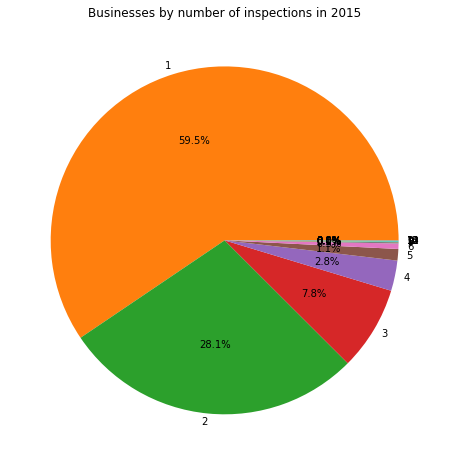

In [148]:
pie_val=np.bincount(insp_2015)
fig, ax = plt.subplots(figsize=(8,8))


ax.pie(pie_val,labeldistance=1.05, labels=np.arange(len(pie_val)), autopct='%1.1f%%',
          startangle=0)

plt.title("Businesses by number of inspections in 2015")
plt.show()

We can see that actually more than half got only one inspection, and that less than a third got two

The article asks: Are twice-a-year restaurant inspections necessary to protect people from foodborne illness or not?

In [175]:
# extract Business IDs of establishment that had at least one food poisoning inspection
poisoning_bus=food[food["Inspection Type"]=="food poisoning"]["Business ID"]

In [176]:
# Get all the other inspections that these establishments had
poisoning=food[[business in poisoning_bus.values for business in food["Business ID"]]]

Let's investigate the type and frequency of inspections these businesses were having 

In [177]:
poisoning_date=poisoning[poisoning["Inspection Type"]=="food poisoning"][["Business ID","Inspection Date"]]

In [178]:
poisoning=pd.merge(poisoning,poisoning_date,how="left",left_on="Business ID",right_on="Business ID",suffixes=[""," fp"])

In [192]:
prior_inspections=poisoning[poisoning["Inspection Date"]<=poisoning["Inspection Date fp"]][['Inspection ID', 
        'DBA Name', 'AKA Name', 'License #', 'Facility Type',
       'Risk', 'Address','Inspection Date', 'Inspection Type', 'Year',
       'Results', 'Violations','Business ID', 'Inspection Date fp']]

In [193]:
# We put in this dataframe the last inspection that occured before a food poisoning inspection 
prior_inspections.head()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Inspection Date,Inspection Type,Year,Results,Violations,Business ID,Inspection Date fp
0,104236,tempo cafe,Tempo Cafe,80916.0,restaurant,Risk 1 (High),6 E CHESTNUT ST,2010-01-04,canvass,2010,Fail,18. NO EVIDENCE OF RODENT OR INSECT OUTER OPEN...,23783,2017-10-18
1,70271,reggios pizza express,Reggios Pizza Express,1120626.0,restaurant,Risk 1 (High),11601 W TOUHY AVE,2010-01-05,food poisoning,2010,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,19826,2010-01-05
2,58226,kikka kingsbury,Kikka Kingsbury,1968898.0,restaurant,Risk 1 (High),1550 N KINGSBURY ST,2010-01-05,canvass,2010,Pass,"34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GOO...",12918,2011-12-22
3,58225,whole foods market,Whole Foods,1933690.0,grocery store,Risk 1 (High),1550 N KINGSBURY ST,2010-01-05,complaint,2010,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,26251,2017-11-17
4,98315,3811 piramid inc,Borinquen Lounge,71458.0,restaurant,Risk 1 (High),3811 N WESTERN AVE,2010-01-05,food poisoning,2010,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,2980,2010-01-05


In [194]:
prior_inspections.groupby(["Business ID","Year","Inspection Date fp"])["Results"].count().mean()

1.9618120554099587

Businesses that had food poisoning were having two inspections per year before that, which means that they were not sufficient

In [195]:
prior_inspections=prior_inspections.sort_values(by="Inspection Date fp").drop_duplicates(subset=["Inspection ID"])

In [196]:
prior_inspections.groupby(["Business ID","Year"])["Results"].count().mean()

1.9405737704918034

Let's take a look at **Shaws Crab House**. This place had four different food poisoning inspections

In [197]:
shaws=prior_inspections[prior_inspections["Business ID"]==21088][["Inspection ID","Inspection Type","Year",
                "Risk","Inspection Date","Results","Violations","Inspection Date fp"]].sort_values(by="Inspection Date")
shaws

,Inspection ID,Inspection Type,Year,Risk,Inspection Date,Results,Violations,Inspection Date fp
969,413439,canvass,2010,Risk 1 (High),2010-09-14,Pass,"35. WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTR...",2014-09-19
1065,114568,complaint,2010,Risk 1 (High),2010-10-04,Pass,0. None Reported,2014-09-19
2244,575218,canvass,2011,Risk 1 (High),2011-08-30,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,2014-09-19
2252,634460,complaint,2011,Risk 1 (High),2011-09-02,Pass,0. None Reported,2014-09-19
3549,1138501,canvass,2012,Risk 1 (High),2012-09-19,Pass,33. FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSI...,2014-09-19
4837,1360908,canvass,2013,Risk 1 (High),2013-09-12,Pass,31. CLEAN MULTI-USE UTENSILS AND SINGLE SERVIC...,2014-09-19
6228,1439509,canvass,2014,Risk 1 (High),2014-09-04,Pass,"34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GOO...",2014-09-19
6282,1496932,food poisoning,2014,Risk 1 (High),2014-09-19,Pass w/ Conditions,2. FACILITIES TO MAINTAIN PROPER TEMPERATURE -...,2014-09-19
6299,1497077,complaint,2014,Risk 1 (High),2014-09-23,Pass w/ Conditions,"1. SOURCE SOUND CONDITION, NO SPOILAGE, FOODS ...",2017-09-05
6305,1497056,reinspection,2014,Risk 1 (High),2014-09-23,Pass,"34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GOO...",2017-09-05


In [198]:
shaws["Inspection Type"].value_counts()

complaint         12
canvass            6
food poisoning     4
reinspection       2
Name: Inspection Type, dtype: int64

In [199]:
shaws["Year"].unique()

array([2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018], dtype=int64)

Between 2010 and 2018 this place had 6 canvass inspections, so less than once per year and none of them failed. Let's separate the inspections with the food poisoning as separator 

In [200]:
shaws["Inspection Date fp"].unique()

array(['2014-09-19T00:00:00.000000000', '2017-09-05T00:00:00.000000000',
       '2018-08-17T00:00:00.000000000', '2018-09-19T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [201]:
shaws[shaws["Inspection Date fp"]=="2014-09-19"]

,Inspection ID,Inspection Type,Year,Risk,Inspection Date,Results,Violations,Inspection Date fp
969,413439,canvass,2010,Risk 1 (High),2010-09-14,Pass,"35. WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTR...",2014-09-19
1065,114568,complaint,2010,Risk 1 (High),2010-10-04,Pass,0. None Reported,2014-09-19
2244,575218,canvass,2011,Risk 1 (High),2011-08-30,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,2014-09-19
2252,634460,complaint,2011,Risk 1 (High),2011-09-02,Pass,0. None Reported,2014-09-19
3549,1138501,canvass,2012,Risk 1 (High),2012-09-19,Pass,33. FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSI...,2014-09-19
4837,1360908,canvass,2013,Risk 1 (High),2013-09-12,Pass,31. CLEAN MULTI-USE UTENSILS AND SINGLE SERVIC...,2014-09-19
6228,1439509,canvass,2014,Risk 1 (High),2014-09-04,Pass,"34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GOO...",2014-09-19
6282,1496932,food poisoning,2014,Risk 1 (High),2014-09-19,Pass w/ Conditions,2. FACILITIES TO MAINTAIN PROPER TEMPERATURE -...,2014-09-19


The food poisoning happened in 19/09/2014, before that the last three inspections were canvass and they all passed while reporting many violations. The last one taking place two weeks before the food poisoning incident, let's take a look at the violations

In [202]:
prior_violations=shaws.loc[6228]["Violations"]


In [204]:
from wordcloud import WordCloud, STOPWORDS 


def wordcloud(words):
    val = str(words) 
    comment_words = ' '
    stopwords = set(STOPWORDS)
    # split the value 
    tokens = val.split() 

    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 

    for words in tokens: 
        comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 1200, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
  
    plt.show()


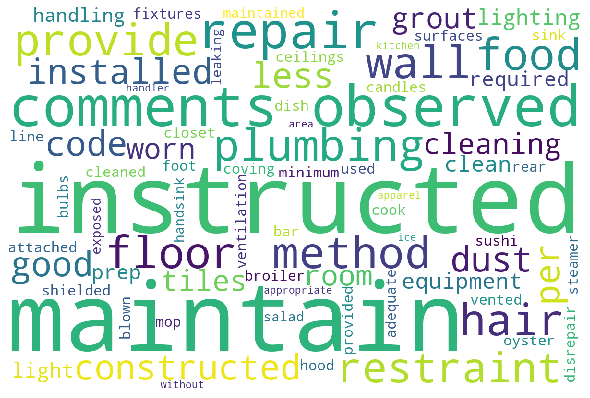

In [205]:
# This is the wordcloud of violations in the last inspection
wordcloud(prior_violations)

In [206]:
violations_after_poisoning=poisoning[(poisoning["Business ID"]==21088)
                     & (poisoning["Inspection Date"]=="2014-09-19")]["Violations"].head(1).values

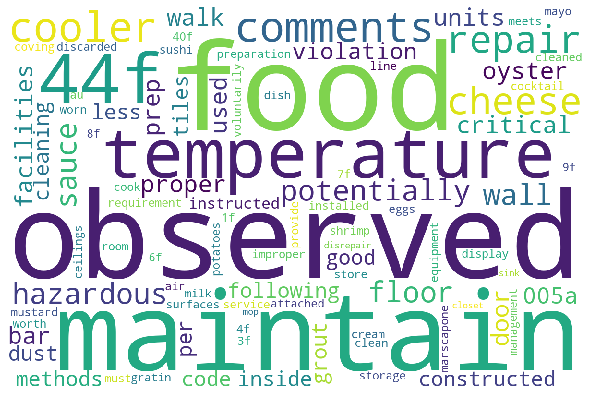

In [379]:
# This is the wordcloud of violations in the food poisoning inspection
wordcloud(violations_after_poisoning)

In [380]:
prior_violations

'34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GOOD REPAIR, COVING INSTALLED, DUST-LESS CLEANING METHODS USED - Comments: OBSERVED GROUT WORN BETWEEN FLOOR TILES IN THE DISH ROOM, SUSHI AND OYSTER BAR COOK LINE. INSTRUCTED TO PROVIDE AND MAINTAIN GROUT BETWEEN  FLOOR TILES. | 35. WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTRUCTED PER CODE: GOOD REPAIR, SURFACES CLEAN AND DUST-LESS CLEANING METHODS - Comments: OBSERVED THE WALL IN DISREPAIR IN THE MOP SINK CLOSET. INSTRUCTED TO REPAIR AND MAINTAIN ALL WALLS. | 36. LIGHTING: REQUIRED MINIMUM FOOT-CANDLES OF LIGHT PROVIDED, FIXTURES SHIELDED - Comments: OBSERVED BLOWN LIGHT BULBS UNDER THE REAR BROILER AND STEAMER HOOD. INSTRUCTED TO PROVIDE AND MAINTAIN ADEQUATE LIGHTING. | 38. VENTILATION: ROOMS AND EQUIPMENT VENTED AS REQUIRED: PLUMBING: INSTALLED AND MAINTAINED - Comments: OBSERVED THE PLUMBING LEAKING AT THE SALAD PREP EXPOSED HANDSINK. INSTRUCTED TO REPAIR AND MAINTAIN ALL PLUMBING. | 42. APPROPRIATE METHOD OF HANDLING OF FOOD (ICE) HAIR 

In [378]:
violations_after_poisoning

array(['2. FACILITIES TO MAINTAIN PROPER TEMPERATURE - Comments: FACILITIES DO NOT MAINTAIN PROPER TEMPERATURE.  OBSERVED THE 2 DOOR PREP COOLER AT THE OYSTER BAR WITH AN AIR TEMPERATURE OF 45.6F AND THE WALK-IN COOLER AT 44F.  BOTH UNITS WERE USED TO STORE POTENTIALLY HAZARDOUS FOODS.  MUST REPAIR AND MAINTAIN BOTH UNITS BELOW 40F.  CRITICAL VIOLATION 7-38-005A. | 3. POTENTIALLY HAZARDOUS FOOD MEETS TEMPERATURE REQUIREMENT DURING STORAGE, PREPARATION DISPLAY AND SERVICE - Comments: OBSERVED POTENTIALLY HAZARDOUS FOODS AT IMPROPER TEMPERATURES.  OBSERVED THE FOLLOWING FOODS INSIDE OF THE 2 DOOR PREP COOLER: MUSTARD/MAYO SAUCE AT 44F, COCKTAIL SAUCE AT 44.9F, AND SHRIMP AT 44F.  OBSERVED THE FOLLOWING FOODS INSIDE OF THE WALK-IN COOLER: EGGS AT 43.8F, MARSCAPONE CHEESE AT 44F, MILK AT 45.3F, CREAM CHEESE AT 43.7F, CHEESE AT 43.1F, AU GRATIN POTATOES AT 44.4F, CHEESE SAUCE AT 44F.  MANAGEMENT VOLUNTARILY DISCARDED 240# OF FOOD WORTH $625.  CRITICAL VIOLATION 7-38-005A. | 34. FLOORS: CONS

In [207]:
def diff(first, second):
        second = set(second)
        return [item for item in first if item not in second]

We see a radical change between the two inspections. For the first some minor problems are observed but nothing really problematic. 2 weeks later it's a whole different story. Indeed, a lot of major problems are observed especially regarding the temperature where a several observations are made. We can conjecture that the first inspection wasn't done correctly because many new critical observations are made within a small amount of time. This case brings us back to the question raised in the article: **Does Chicago need more inspectors, or more realistic rules?**

To answer this question we check the distribution of the violation numbers depending on the results of the food poisoning inspection.

In [330]:
def dist(row):
    for e in row:
        violation_nbre.append(int(e))

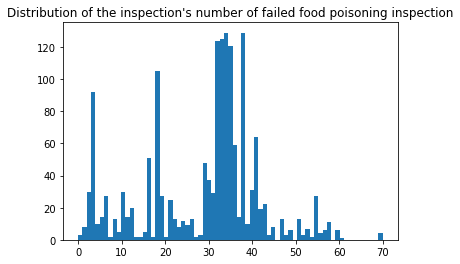

38    129
34    129
33    125
32    124
35    121
Name: 0, dtype: int64

In [331]:
violation_nbre = []
food[(food['Inspection Type'] == 'food poisoning') & (food['Fail'] == 1)]['Violation numbers'].apply(dist)
plt.hist(violation_nbre,bins = 71)
plt.title("Distribution of the inspection's number of failed food poisoning inspection")
plt.show()

violation_count_fail= pd.DataFrame(violation_nbre)[0].value_counts().sort_values(ascending=False)[:10]
violation_count_fail.head()

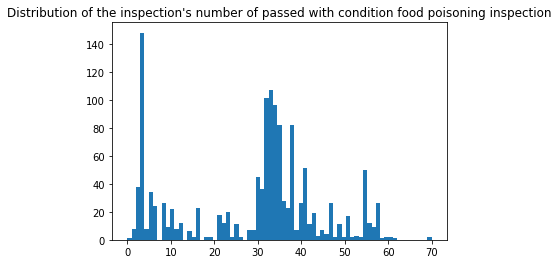

3     148
33    107
32    101
34     96
38     82
Name: 0, dtype: int64

In [332]:
violation_nbre = []

food[(food['Inspection Type'] == 'food poisoning') & (food['Pass w/ Conditions'] == 1)]['Violation numbers'].apply(dist)
plt.hist(violation_nbre,bins = 71)
plt.title("Distribution of the inspection's number of passed with condition food poisoning inspection")
plt.show()

violation_count_pass = pd.DataFrame(violation_nbre)[0].value_counts().sort_values(ascending=False)[:10]
violation_count_pass.head()

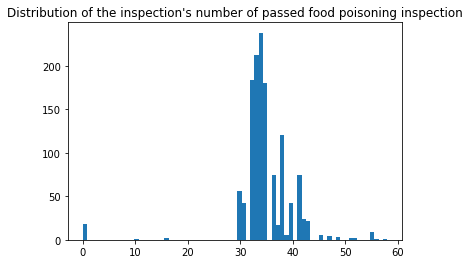

34    238
33    212
32    184
35    180
38    121
Name: 0, dtype: int64

In [333]:
violation_nbre = []

food[(food['Inspection Type'] == 'food poisoning') & (food['Pass'] == 1)]['Violation numbers'].apply(dist)
plt.hist(violation_nbre,bins = 71)
plt.title("Distribution of the inspection's number of passed food poisoning inspection")
plt.show()

violation_count_pass = pd.DataFrame(violation_nbre)[0].value_counts().sort_values(ascending=False)[:10]
violation_count_pass.head()

As expected it's the critcial inspection numbers that make the food poisoning inspection fail.

We will now check what happened to the establishments one month before they fail their food poisoning inspection.More precisely, we will check establishments that passed an inspection less than a month before having a food poisoning inspection. The idea is to check if there are violations that are usually observed before a food poisoning case.

In [334]:
pois_food = food[(food['Inspection Type'] == 'food poisoning')]
visit_before_fp = pd.DataFrame()

for resto in pois_food.values:
    license_nbre = resto[3]
    date = resto[8]
    before = food[(food['License #'] == license_nbre) & (food['Inspection Date'] < date)].sort_values(by='Inspection Date', ascending =False)
    if(len(before) != 0):
        dif_date = date - before.iloc[0][8]
        before['Date dif'] = dif_date
        visit_before_fp = visit_before_fp.append(before.iloc[0])

In [335]:
df_pass_after_month_fp = visit_before_fp[(visit_before_fp['Date dif'] < '30 days') & (visit_before_fp['Pass'] == 1)] 

In [336]:
df_pass_after_month_fp[['AKA Name','Address']]

,AKA Name,Address
194106,Mia Francesca,3311 N CLARK ST
192577,I Love Sushi,233 N MICHIGAN AVE
193803,Churchs Chicken478,101 E 35TH ST
192845,Su Casa,49 E ONTARIO ST
194838,Subway,5240 N PULASKI RD
...,...,...
73604,Damenzos,2322-2324 W TAYLOR ST
64533,La Tapenade,11601 W TOUHY AVE
54186,Lawrence Fish Market,3914 W LAWRENCE AVE
49029,Panda Express,2949 W ADDISON AVE


In [337]:
titles = list()
for e in visit_before_fp['Violation title'].values:
    titles = titles+e

In [388]:
numbers = list()
for e in visit_before_fp['Violation numbers'].values:
    for n in e:
        numbers.append(int(n))


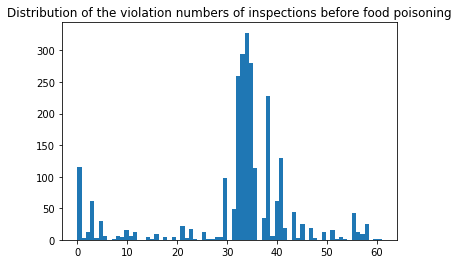

In [390]:
plt.hist(numbers,bins = 71)
plt.title("Distribution of the violation numbers of inspections before food poisoning")
plt.show()


Most of the violations lie within the minor range, let's take a deeper look on what these violations are about

In [338]:
df_title= pd.DataFrame(titles)
df_title[0].value_counts().head(20)

FLOORS: CONSTRUCTED PER CODE, CLEANED, GOOD REPAIR, COVING INSTALLED, DUST-LESS CLEANING METHODS USED                      328
FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSILS CLEAN, FREE OF ABRASIVE DETERGENTS                                            294
WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTRUCTED PER CODE: GOOD REPAIR, SURFACES CLEAN AND DUST-LESS CLEANING METHODS       280
FOOD AND NON-FOOD CONTACT SURFACES PROPERLY DESIGNED, CONSTRUCTED AND MAINTAINED                                           260
VENTILATION: ROOMS AND EQUIPMENT VENTED AS REQUIRED: PLUMBING: INSTALLED AND MAINTAINED                                    224
PREMISES MAINTAINED FREE OF LITTER, UNNECESSARY ARTICLES, CLEANING  EQUIPMENT PROPERLY STORED                              123
None Reported                                                                                                              116
LIGHTING: REQUIRED MINIMUM FOOT-CANDLES OF LIGHT PROVIDED, FIXTURES SHIELDED                                   

Violations talking about **food** and **temperature** are good indicators of potential food poisoning, so let's see the most prominent ones

In [392]:
df_title[ [('FOOD' in title) or ('TEMPERATURE' in title) for title in df_title[0]] ][0].value_counts().head(20)

FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSILS CLEAN, FREE OF ABRASIVE DETERGENTS                                     294
FOOD AND NON-FOOD CONTACT SURFACES PROPERLY DESIGNED, CONSTRUCTED AND MAINTAINED                                    260
FOOD IN ORIGINAL CONTAINER, PROPERLY LABELED: CUSTOMER ADVISORY POSTED AS NEEDED                                     98
FOOD (ICE) DISPENSING UTENSILS, WASH CLOTHS PROPERLY STORED                                                          42
POTENTIALLY HAZARDOUS FOOD MEETS TEMPERATURE REQUIREMENT DURING STORAGE, PREPARATION DISPLAY AND SERVICE             31
MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL EMPLOYEE; KNOWLEDGE, RESPONSIBILITIES AND REPORTING                        30
FOOD HANDLER REQUIREMENTS MET                                                                                        23
* CERTIFIED FOOD MANAGER ON SITE WHEN POTENTIALLY HAZARDOUS FOODS ARE  PREPARED AND SERVED                           21
FOOD & NON-FOOD CONTACT SURFACES CLEANAB

In [395]:
len(df_title[ [('FOOD' in title) or ('TEMPERATURE' in title) for title in df_title[0]] ][0])/len(df_title[0])

0.3766077170418006

These violations are strong hints of a potential case of food poisoning, and they represent more than third of all the violations reported in these passed inspections. So we can conclude that food inspections needed stricter rules rather than more inspectors